# Lab 3: Logistic Regression

In this practice session, you are invited to train a logistic regression classifier using gradient descent method in a first time then a python optimization function. First, you will work on simulated data. After that, your classifier will predict if student will be admitted or not given his score in two main exams. 

<h2>Preparation</h2>

We'll need the following libraries:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.axes3d import*
from matplotlib import cm
from matplotlib.patches import Rectangle
from scipy.optimize import fmin_bfgs

The class <code>plot_error_surfaces</code> is just to help you visualize the data space

In [2]:
# Create class for plotting and the function for plotting

class plot_error_surfaces(object):
    
    # Construstor
    def __init__(self, w_range, b_range, X, Y, cost_fn, n_samples = 30, go = True):
        W = np.linspace(-w_range, w_range, n_samples)
        B = np.linspace(-b_range, b_range, n_samples)
        w, b = np.meshgrid(W, B)    
        Z = np.zeros((30, 30))
        count1 = 0
        self.y = Y
        self.x = X
        for w1, b1 in zip(w, b):
            count2 = 0
            for w2, b2 in zip(w1, b1):
                if (cost_fn=='MSE'):
                    Z[count1, count2] = np.mean((self.y - (1 / (1 + np.exp(-1*w2 * self.x - b2)))) ** 2)
                else:
                    yhat= 1 / (1 + np.exp(-1*(w2*self.x+b2)))
                    Z[count1,count2]=-1*np.mean(self.y*np.log(yhat+1e-16) +(1-self.y)*np.log(1-yhat+1e-16))
                count2 += 1   
            count1 += 1
        self.Z = Z
        self.w = w
        self.b = b
        self.W = []
        self.B = []
        self.LOSS = []
        self.n = 0
        if go == True:
            plt.figure()
            plt.figure(figsize = (7.5, 5))
            plt.axes(projection = '3d').plot_surface(self.w, self.b, self.Z, rstride = 1, cstride = 1, cmap = 'viridis', edgecolor = 'none')
            plt.title('Loss Surface')
            plt.xlabel('w')
            plt.ylabel('b')
            plt.show()
            plt.figure()
            plt.title('Loss Surface Contour')
            plt.xlabel('w')
            plt.ylabel('b')
            plt.contour(self.w, self.b, self.Z)
            plt.show()
            
     # Setter
    def set_para_loss(self, w,b, loss):
        self.n = self.n + 1
        self.W.append(w)
        self.B.append(b)
        self.LOSS.append(loss)
    
    # Plot diagram
    def final_plot(self): 
        ax = plt.axes(projection = '3d')
        ax.plot_wireframe(self.w, self.b, self.Z)
        ax.scatter(self.W, self.B, self.LOSS, c = 'r', marker = 'x', s = 200, alpha = 1)
        plt.figure()
        plt.contour(self.w, self.b, self.Z)
        plt.scatter(self.W, self.B, c = 'r', marker = 'x')
        plt.xlabel('w')
        plt.ylabel('b')
        plt.show()
        
    # Plot diagram
    def plot_ps(self):
        plt.subplot(121)
        plt.ylim
        plt.plot(self.x, self.y, 'ro', label = "training points")
        plt.plot(self.x, self.W[-1] * self.x + self.B[-1], label = "estimated line")
        plt.plot(self.x, 1 / (1 + np.exp(-1 * (self.W[-1] * self.x + self.B[-1]))), label = 'sigmoid')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.ylim((-0.1, 2))
        plt.title('Data Space Iteration: ' + str(self.n))
        plt.show()
        plt.subplot(122)
        plt.contour(self.w, self.b, self.Z)
        plt.scatter(self.W, self.B, c = 'r', marker = 'x')
        plt.title('Loss Surface Contour Iteration' + str(self.n))
        plt.xlabel('w')
        plt.ylabel('b')
        
# Plot the diagram

def PlotStuff(X, Y, model, epoch, leg = True):
    plt.plot(X.numpy(), model(X).detach().numpy(), label = 'epoch ' + str(epoch))
    plt.plot(X.numpy(), Y.numpy(), 'r')
    if leg == True:
        plt.legend()
    else:
        pass

## Part 1: Simulated Data

<h2 id="Makeup_Data">Create Some Data</h2>

**Question 1:**
- Use [<code>numpy.arange</code>](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.arange.html) to generate values from -1 to 1 with a step of 0.1 in the variable X. 
- Use [<code>numpy.zeros</code>](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.zeros.html) to generate an array of zeros having the same shape of X in the variable Y.

In [3]:
# Type your code here
X = np.arange(-1,1,0.1)
X = X[:,np.newaxis]                    # we add np.newaxis in the indexing to obtain an array of shape (m,1) instead of (m,1)
print (X.shape)
# Type your code here
Y = np.zeros(X.shape)
print(Y.shape)

Y[X[:, 0] > 0.2] = 1

(20, 1)
(20, 1)


Let us plot the generated data.

Text(0, 0.5, 'Y')

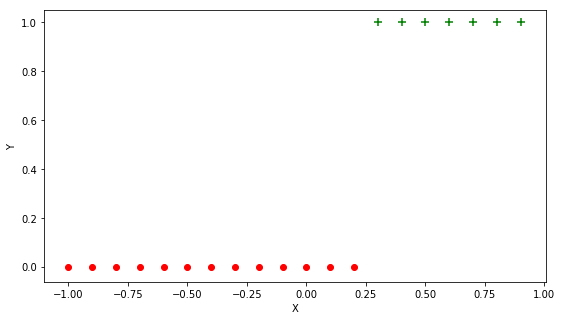

In [4]:
plt.figure("Visualize Data",figsize=(9,5))
plt.scatter(X[Y==0], Y[Y==0],  color='red')
plt.scatter(X[Y==1], Y[Y==1],  color='green',marker='+',s=80)
plt.xlabel('X')
plt.ylabel('Y')

**Question 2: **
- Build the matrix X with shape (m,2) that represents 2 features: a column of ones that represents the bias term and a column of the generated data.  
**Hint:** You can use numpy [concatenate](https://docs.scipy.org/doc/numpy/reference/generated/numpy.concatenate.html) function (put two columns or array together).

In [5]:
# Type your code here

#bias
a = np.ones((X.shape[0],1))
print(a.shape)
#generated data X
X = np.concatenate((a,X),axis=1)
print(X.shape)

(20, 1)
(20, 2)


<h2 id="Model_Cost">Create the Model and Cost Function</h2>

**Question 3: **  
- Create a sigmoid function that returns $sigmoid(z)=\frac{1}{1+e^{-z}}$  
**Hint:** For a vectorized implementation:
- Use [<code>numpy.ones</code>](https://docs.scipy.org/doc/numpy-1.14.0/reference/generated/numpy.ones.html) to have a numerator with the same shape of z
- Use [<code>numpy.exp</code>](https://docs.scipy.org/doc/numpy/reference/generated/numpy.exp.html)

In [6]:
def sigmoid(z):
    # Type your code here
    a1 = np.ones(z.shape)
    sigmoid=a1/(a1+np.exp(-z))
    return sigmoid

Plot the sigmoid function:

Text(0, 0.5, 'sigmoid(z)')

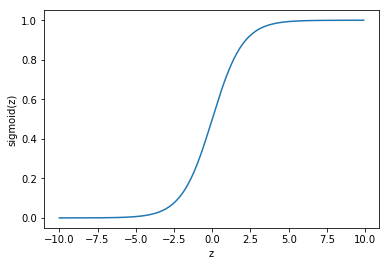

In [7]:
z=np.arange(-10, 10, 0.1).reshape(-1, 1)
plt.plot(z, sigmoid(z))
plt.xlabel('z')
plt.ylabel('sigmoid(z)')

**Question 4: **
- Create your logistic regression predict function
$$yhat=sigmoid(\theta^\top x)=\frac{1}{1+e^{-\theta^\top x}}$$
**Hint:** Use the sigmoid function  
This new hypothesis formulas will ensure: $0\leq yhat_i\leq 1$  

In [8]:
# Create predict function
def predict(x,theta):
    # Type your code here
    yhat=0
    #a1 = np.ones((x.shape[0],1))
    yhat = sigmoid(np.dot(x,theta))
    #yhat=a1/(a1+np.exp(-np.dot(theta.transpose(),x)))
    return yhat

**Question 5:** 
- Store in the variable m the number of samples.
- Define the criterion or cost function that returns the MSE (Mean Square Error):  
**Mean Squared Error (MSE)**: $cost = \frac{1}{2~m} \sum_{i=1}^{m}{(yhat_i - y_i)^2}$

In [9]:
# Create the MSE function to evaluate the result.

def MSE_cost(yhat, y):
    # Type your code here
    m = y.shape[0]
    #MSE cost function
    cost = np.dot((1/2*m),np.sum((yhat-y)**2))
    return cost

Create a <code> plot_error_surfaces</code> object to visualize the loss when we use the MSE cost

<Figure size 432x288 with 0 Axes>

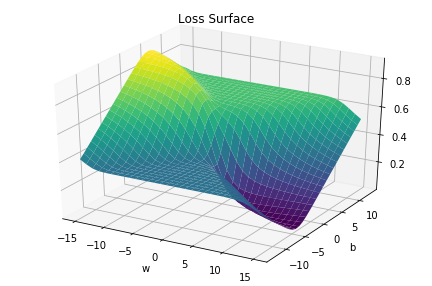

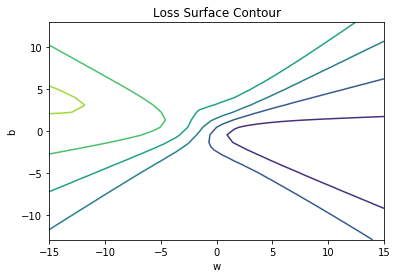

In [10]:
get_surface1 = plot_error_surfaces(15, 13, X[:,1,np.newaxis], Y,'MSE', 30)

'''As can we see some the graph, the average squared difference between the estimated values and original values. Thus, the value can get to the lowest value, which is the darkest blue part in the graph.'''

**Question 6:** 
- Store in the variable m the number of samples.
- Define the criterion or cost function that returns the NLL (Negative Log Likelihood Error):  
**Negative Log Likelihood Error (NLL)**: $$cost=J(\theta)=\frac{-1}{m}\sum_{i=1}^{m}\left [y\times log(yhat)+(1-y)\times log(1-yhat)\right ]$$
**Hint:** For a vectorized implementation:
- Use [<code>numpy.sum</code>](https://docs.scipy.org/doc/numpy-1.15.1/reference/generated/numpy.sum.html) and [<code>numpy.log</code>](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.log.html)

In [11]:
def NLL_cost(yhat, y):
    # Type your code here
    m=y.shape[0]
    a1 = np.ones((y.shape[0],1))   
    J =(-np.sum((np.log(yhat)*y)+(np.log(a1-yhat)*(a1-y))))/m
    return J

Create a <code> plot_error_surfaces</code> object to visualize the loss when we use the NLL cost

<Figure size 432x288 with 0 Axes>

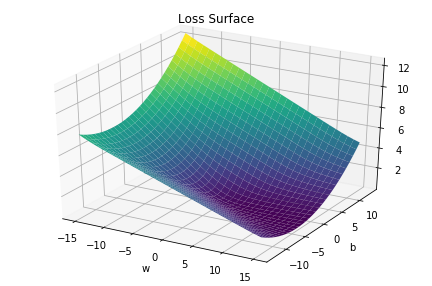

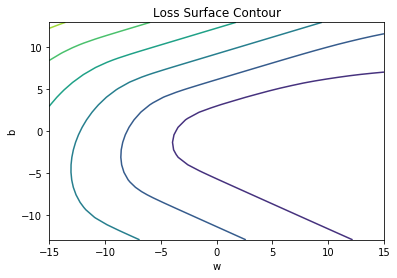

In [12]:
get_surface = plot_error_surfaces(15, 13, X[:,1,np.newaxis], Y,'NLL', 30)

'''The charts show that the negative log-likelihood becomes smaller values, where it can reach infinite, and Because we are summing the loss function to all the correct classes, if confidence is high, the loss will be low, and inversely.'''

**Question 7:** 
The gradient vector of the logistic cost function is calculated as following: $$\nabla J(\theta) = \begin{bmatrix}\frac{\partial J(\theta)}{\partial \theta_0}
\\ \frac{\partial J(\theta)}{\partial \theta_1}
\\ \vdots
\\ \frac{\partial J(\theta)}{\partial \theta_{n-1}}
\end{bmatrix}$$ 
where: $\frac{\partial J(\theta)}{\partial \theta_j} = \frac{1}{m} \sum_{i=1}^{m}{(yhat_i - y_i)~x_{ij}} ~~for~ j=0\dots n-1$
- Implement the "grad_cost_func" function that evaluates the gradient of logistic cost function.  
**Hint:** You can use the vectorized form: $\nabla J(\theta) =\frac{1}{m} x^T(yhat-y)$

In [13]:
def grad_cost_func(theta, x, y):
    # Type your code here
    m = y.shape[0]
    yhat=0
    yhat=predict(x,theta)
    g= np.dot(x.transpose(),(yhat-y))/m
    return g

Let us define the learning rate <code>lr</code>:  

In [14]:
lr=2

Now, we initialize the model parameter to learn.

In [15]:
theta_init=np.array([[0.0],[0.0]],dtype=float)

#### Gradient descent algorithm
The gradient descent algorithm is a downhill iterative optimization method that uses the gradient direction as descending direction on each step to reach a local minimum. For a convex function, such as the NLL cost function, the gradient descent is guaranteed to reach a global minimum.  
The update equation of the optimization parameter $\theta_j$ is given by: $$\theta_j=\theta_j-lr \frac{\partial cost(\theta_j)}{\partial \theta_j} ~~for~ j=0\dots n-1$$
Where $lr:$ represents the step or the learning rate.

**Question 8:** Define a function for training the model by the gradient descent method using the following steps:
- Make a prediction of your data
- Calculate the loss 
- Compute the gradient of the loss
- Update the $\theta$ parameters using the formula above.

In [16]:
# Train the model

def train_model(theta,iter):
    LOSS=[]
    for epoch in range (iter):
        
        # make the prediction
        # Type your code here
        print(X.shape)
        print(theta.shape)
        Yhat = predict(X,theta)
        print(Yhat.shape)
        print(Y.shape)
        
        # calculate the cost
        # Type your code here
        loss = NLL_cost(Yhat, Y)
        
        # store the loss into list
        LOSS.append(loss)
        
        get_surface.set_para_loss(theta[1],theta[0], LOSS)
        
        # Compute gradient of the loss
        # Type your code here
        grad=grad_cost_func(theta, X, Y)
        
        
        # update the theta_1 parameter
        # Type your code here
        theta = theta - lr*grad
        
        if iter % 20 == 0:
            get_surface.plot_ps()
        
    return theta, LOSS

Let's run iterations of gradient descent and determine the optimal prediction of $\theta$

(20, 2)
(2, 1)
(20, 1)
(20, 1)


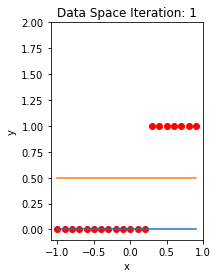

(20, 2)
(2, 1)
(20, 1)
(20, 1)


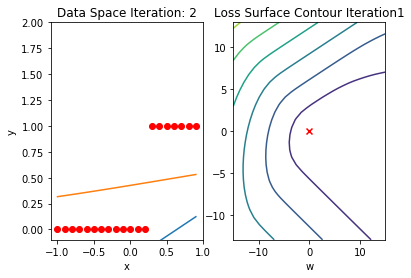

(20, 2)
(2, 1)
(20, 1)
(20, 1)


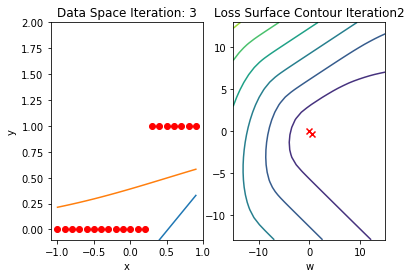

(20, 2)
(2, 1)
(20, 1)
(20, 1)


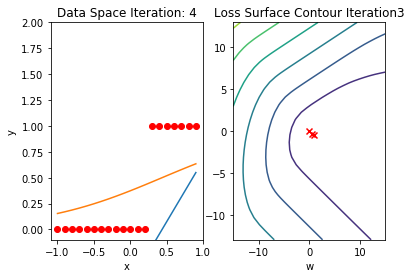

(20, 2)
(2, 1)
(20, 1)
(20, 1)


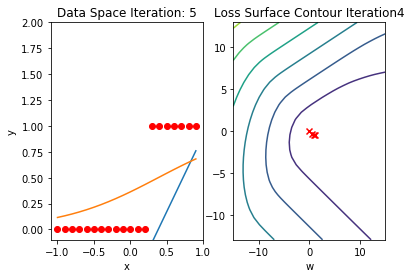

(20, 2)
(2, 1)
(20, 1)
(20, 1)


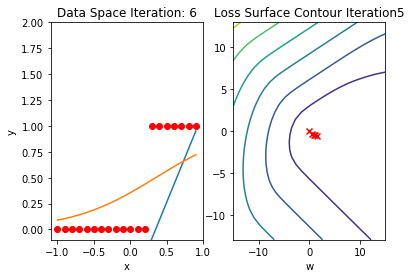

(20, 2)
(2, 1)
(20, 1)
(20, 1)


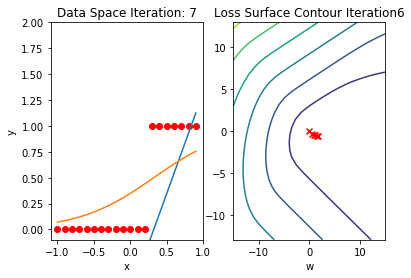

(20, 2)
(2, 1)
(20, 1)
(20, 1)


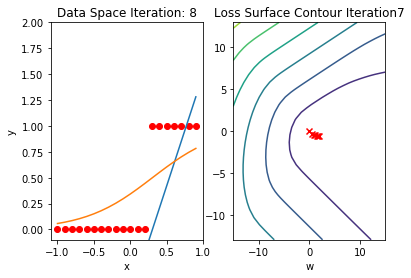

(20, 2)
(2, 1)
(20, 1)
(20, 1)


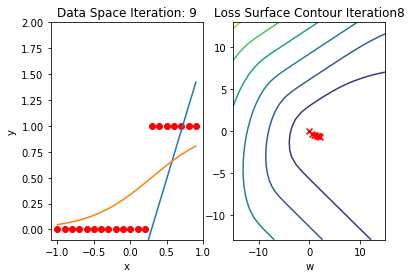

(20, 2)
(2, 1)
(20, 1)
(20, 1)


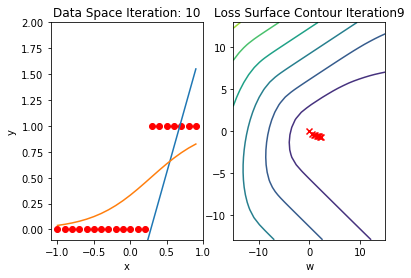

(20, 2)
(2, 1)
(20, 1)
(20, 1)


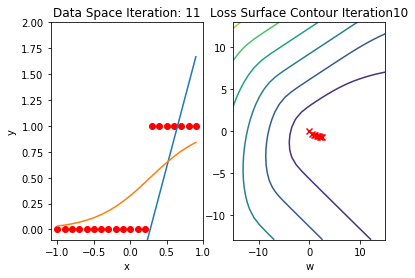

(20, 2)
(2, 1)
(20, 1)
(20, 1)


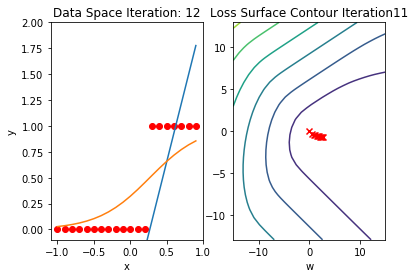

(20, 2)
(2, 1)
(20, 1)
(20, 1)


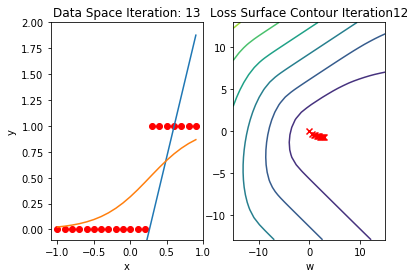

(20, 2)
(2, 1)
(20, 1)
(20, 1)


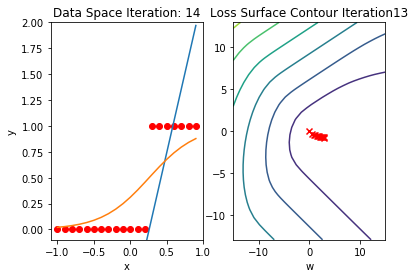

(20, 2)
(2, 1)
(20, 1)
(20, 1)


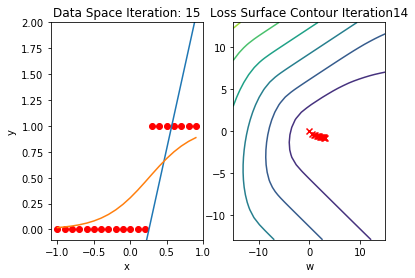

(20, 2)
(2, 1)
(20, 1)
(20, 1)


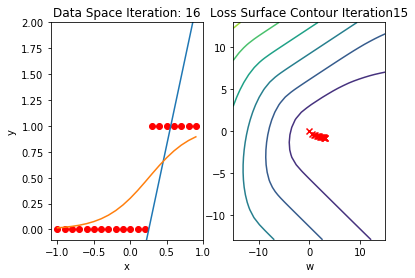

(20, 2)
(2, 1)
(20, 1)
(20, 1)


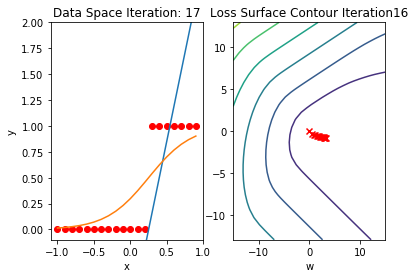

(20, 2)
(2, 1)
(20, 1)
(20, 1)


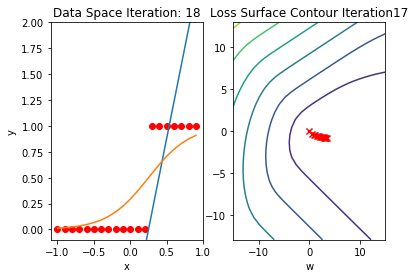

(20, 2)
(2, 1)
(20, 1)
(20, 1)


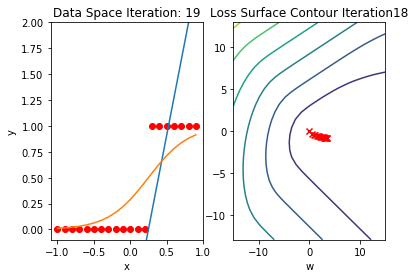

(20, 2)
(2, 1)
(20, 1)
(20, 1)


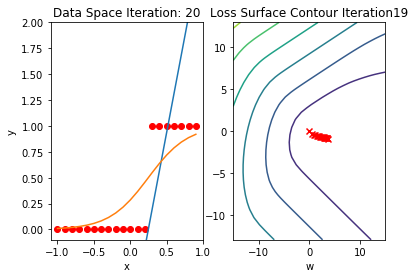

(20, 2)
(2, 1)
(20, 1)
(20, 1)


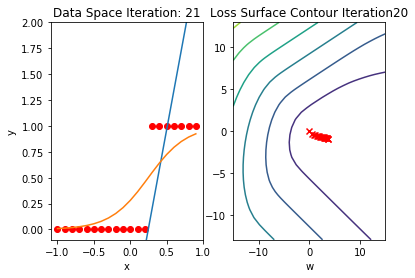

(20, 2)
(2, 1)
(20, 1)
(20, 1)


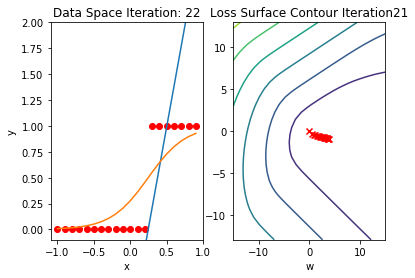

(20, 2)
(2, 1)
(20, 1)
(20, 1)


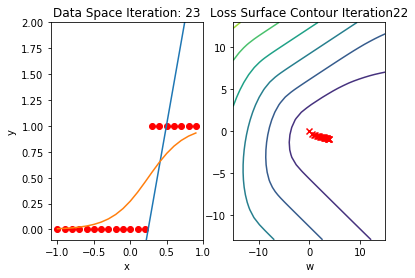

(20, 2)
(2, 1)
(20, 1)
(20, 1)


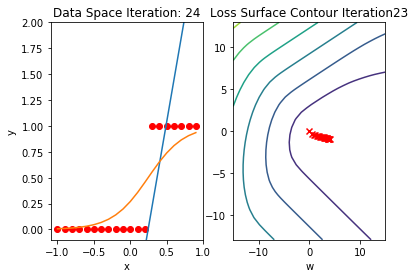

(20, 2)
(2, 1)
(20, 1)
(20, 1)


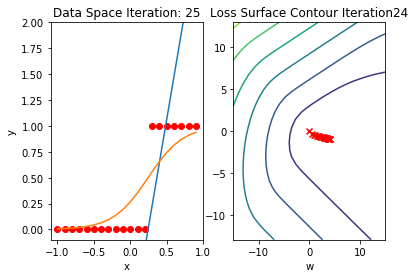

(20, 2)
(2, 1)
(20, 1)
(20, 1)


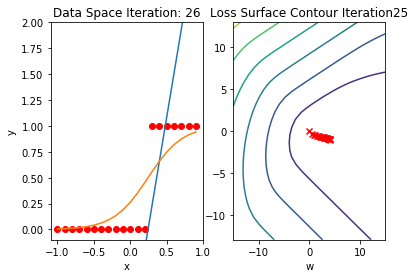

(20, 2)
(2, 1)
(20, 1)
(20, 1)


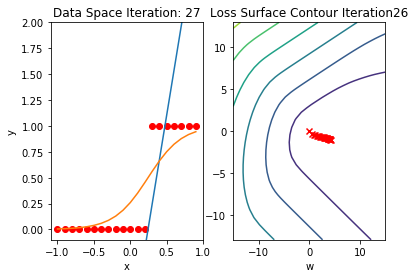

(20, 2)
(2, 1)
(20, 1)
(20, 1)


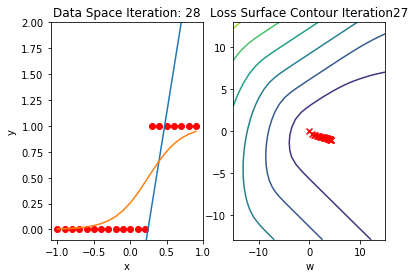

(20, 2)
(2, 1)
(20, 1)
(20, 1)


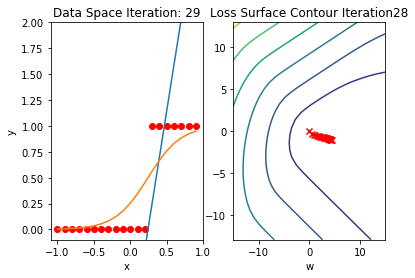

(20, 2)
(2, 1)
(20, 1)
(20, 1)


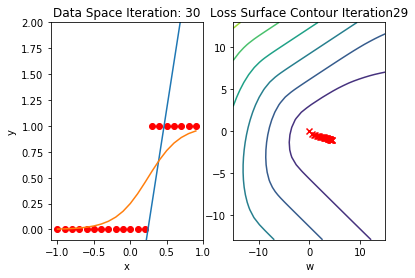

(20, 2)
(2, 1)
(20, 1)
(20, 1)


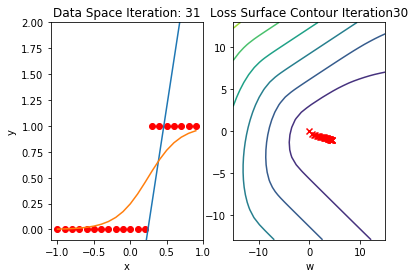

(20, 2)
(2, 1)
(20, 1)
(20, 1)


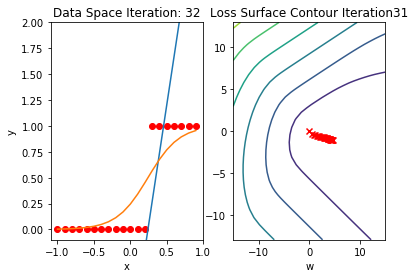

(20, 2)
(2, 1)
(20, 1)
(20, 1)


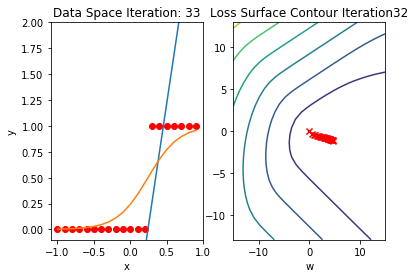

(20, 2)
(2, 1)
(20, 1)
(20, 1)


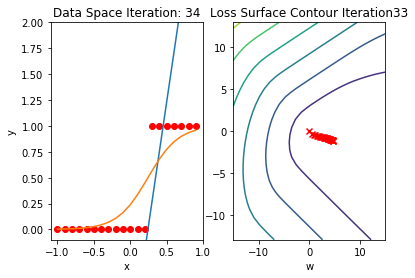

(20, 2)
(2, 1)
(20, 1)
(20, 1)


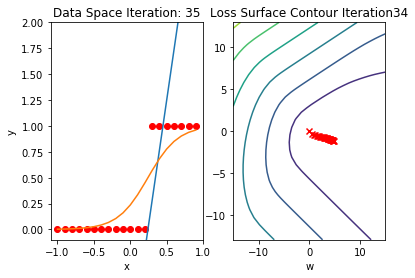

(20, 2)
(2, 1)
(20, 1)
(20, 1)


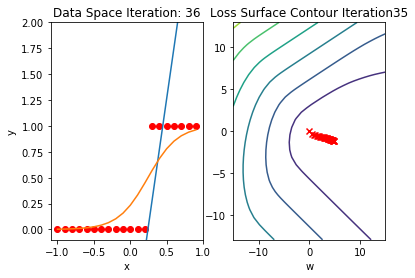

(20, 2)
(2, 1)
(20, 1)
(20, 1)


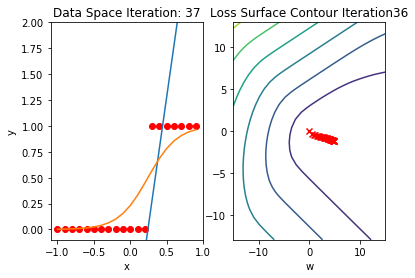

(20, 2)
(2, 1)
(20, 1)
(20, 1)


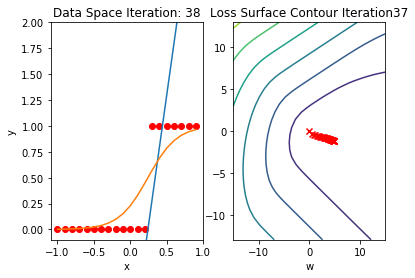

(20, 2)
(2, 1)
(20, 1)
(20, 1)


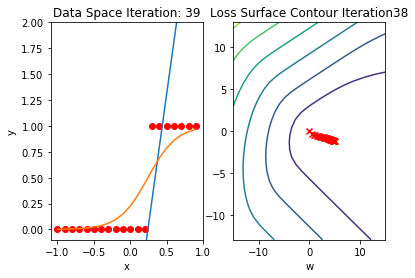

(20, 2)
(2, 1)
(20, 1)
(20, 1)


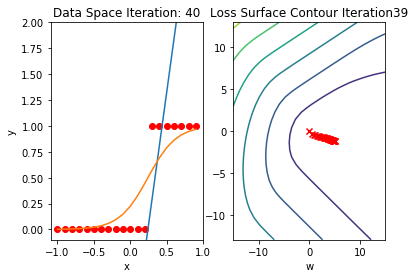

(20, 2)
(2, 1)
(20, 1)
(20, 1)


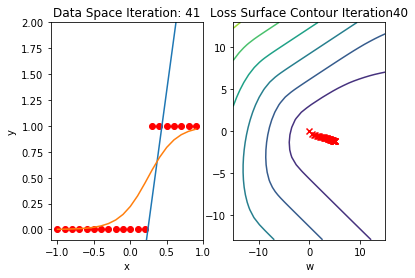

(20, 2)
(2, 1)
(20, 1)
(20, 1)


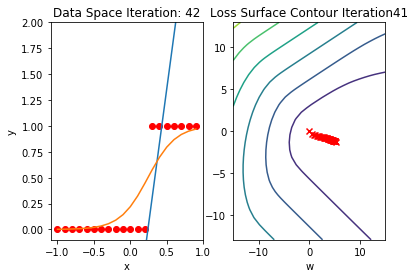

(20, 2)
(2, 1)
(20, 1)
(20, 1)


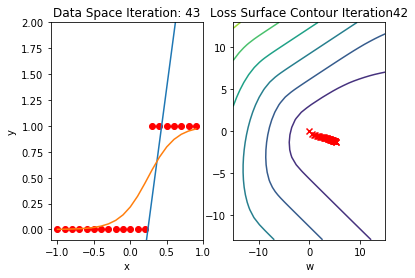

(20, 2)
(2, 1)
(20, 1)
(20, 1)


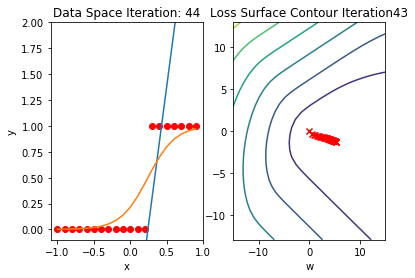

(20, 2)
(2, 1)
(20, 1)
(20, 1)


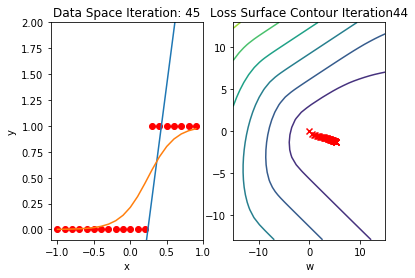

(20, 2)
(2, 1)
(20, 1)
(20, 1)


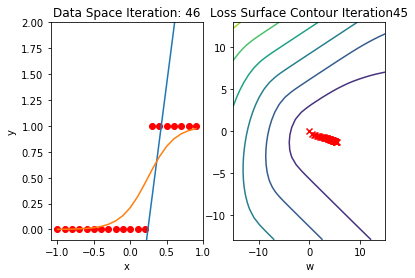

(20, 2)
(2, 1)
(20, 1)
(20, 1)


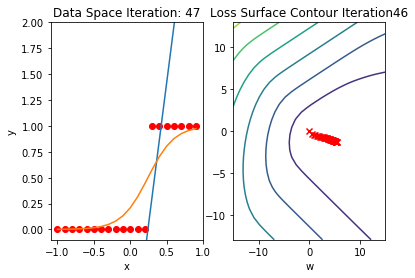

(20, 2)
(2, 1)
(20, 1)
(20, 1)


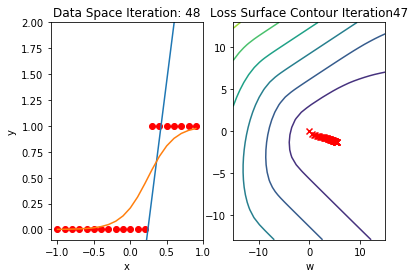

(20, 2)
(2, 1)
(20, 1)
(20, 1)


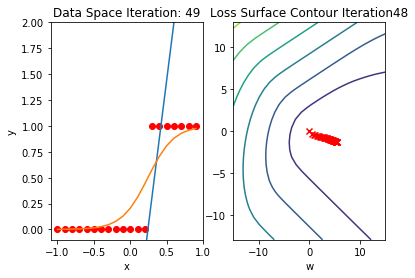

(20, 2)
(2, 1)
(20, 1)
(20, 1)


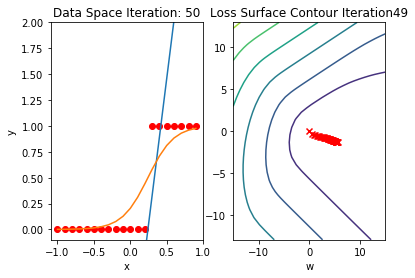

(20, 2)
(2, 1)
(20, 1)
(20, 1)


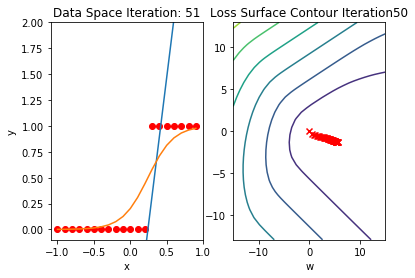

(20, 2)
(2, 1)
(20, 1)
(20, 1)


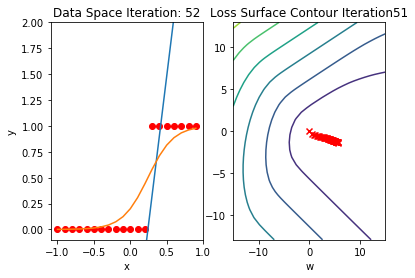

(20, 2)
(2, 1)
(20, 1)
(20, 1)


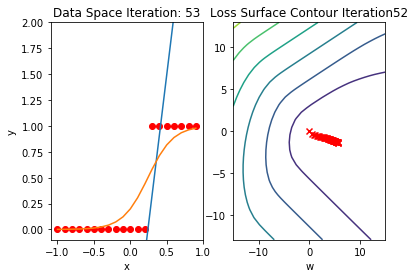

(20, 2)
(2, 1)
(20, 1)
(20, 1)


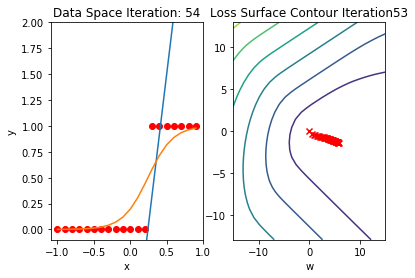

(20, 2)
(2, 1)
(20, 1)
(20, 1)


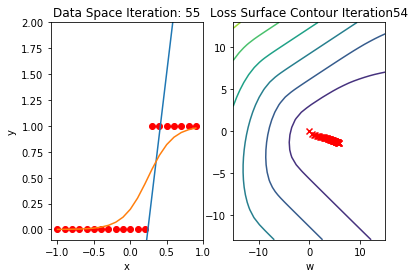

(20, 2)
(2, 1)
(20, 1)
(20, 1)


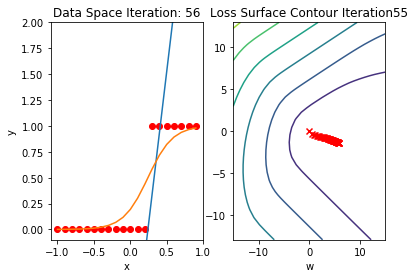

(20, 2)
(2, 1)
(20, 1)
(20, 1)


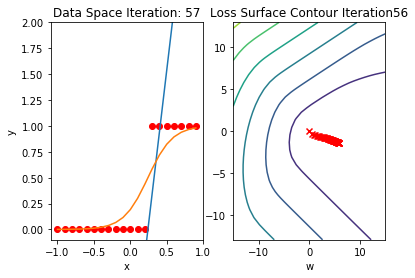

(20, 2)
(2, 1)
(20, 1)
(20, 1)


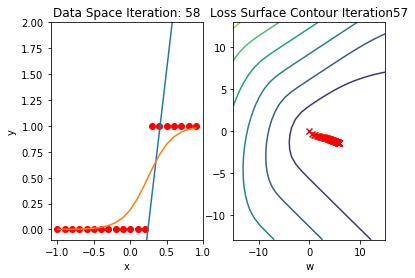

(20, 2)
(2, 1)
(20, 1)
(20, 1)


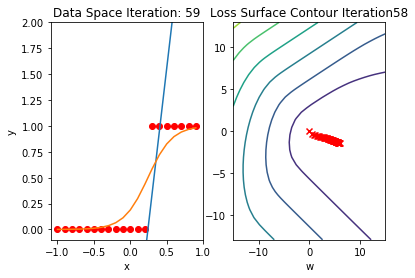

(20, 2)
(2, 1)
(20, 1)
(20, 1)


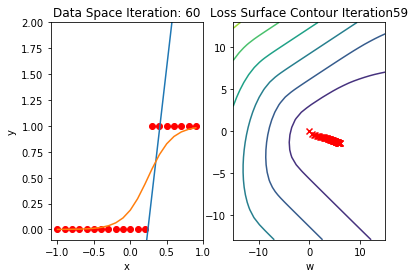

(20, 2)
(2, 1)
(20, 1)
(20, 1)


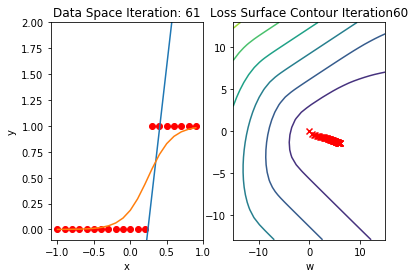

(20, 2)
(2, 1)
(20, 1)
(20, 1)


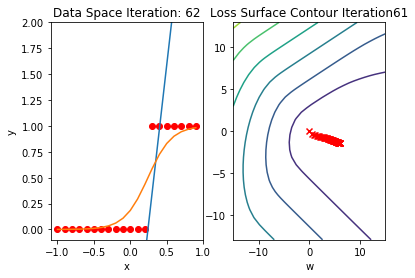

(20, 2)
(2, 1)
(20, 1)
(20, 1)


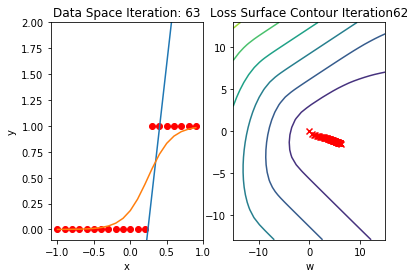

(20, 2)
(2, 1)
(20, 1)
(20, 1)


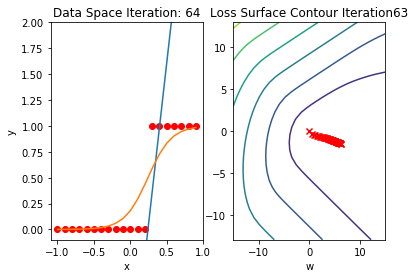

(20, 2)
(2, 1)
(20, 1)
(20, 1)


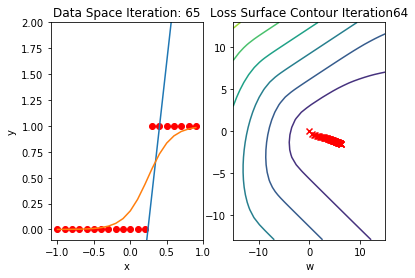

(20, 2)
(2, 1)
(20, 1)
(20, 1)


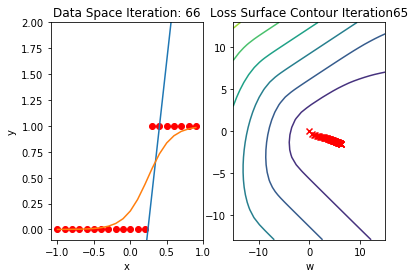

(20, 2)
(2, 1)
(20, 1)
(20, 1)


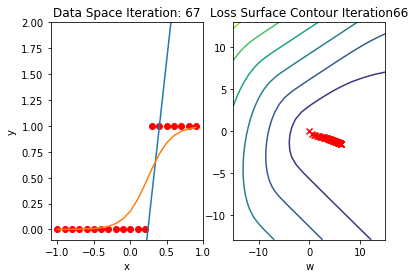

(20, 2)
(2, 1)
(20, 1)
(20, 1)


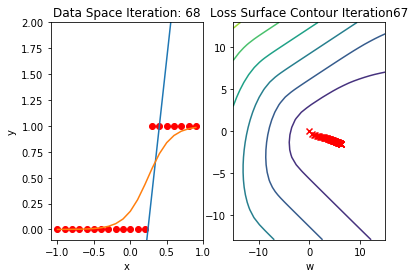

(20, 2)
(2, 1)
(20, 1)
(20, 1)


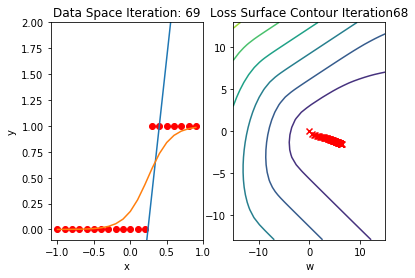

(20, 2)
(2, 1)
(20, 1)
(20, 1)


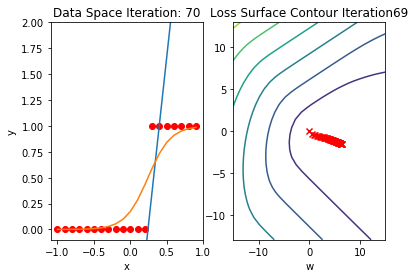

(20, 2)
(2, 1)
(20, 1)
(20, 1)


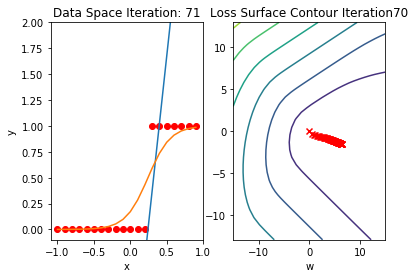

(20, 2)
(2, 1)
(20, 1)
(20, 1)


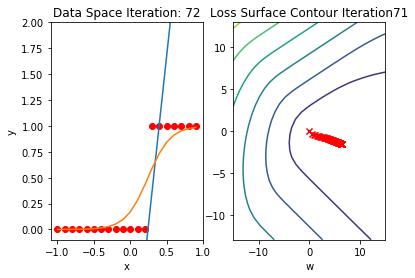

(20, 2)
(2, 1)
(20, 1)
(20, 1)


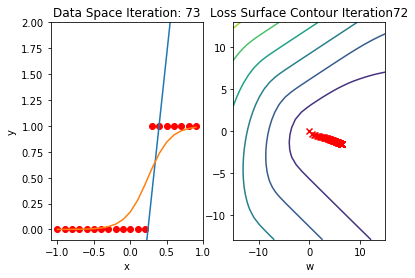

(20, 2)
(2, 1)
(20, 1)
(20, 1)


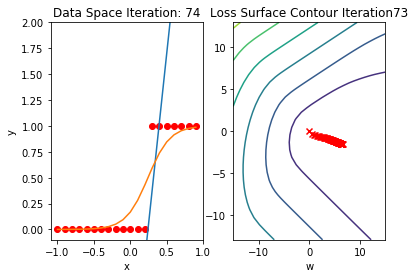

(20, 2)
(2, 1)
(20, 1)
(20, 1)


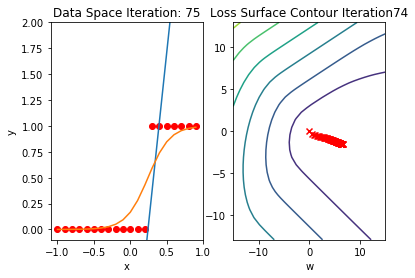

(20, 2)
(2, 1)
(20, 1)
(20, 1)


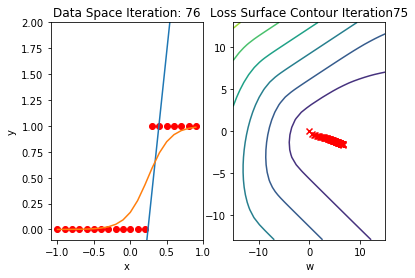

(20, 2)
(2, 1)
(20, 1)
(20, 1)


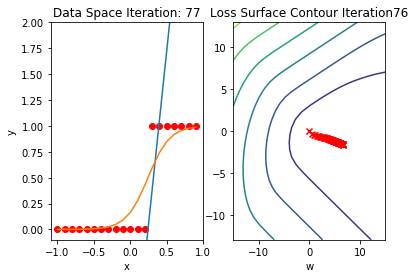

(20, 2)
(2, 1)
(20, 1)
(20, 1)


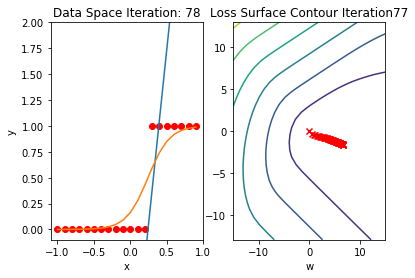

(20, 2)
(2, 1)
(20, 1)
(20, 1)


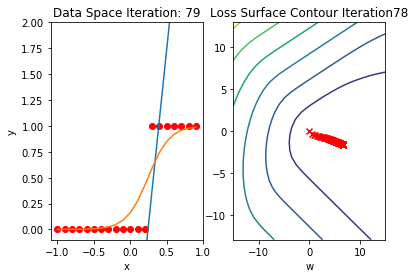

(20, 2)
(2, 1)
(20, 1)
(20, 1)


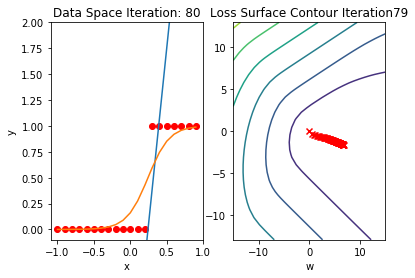

(20, 2)
(2, 1)
(20, 1)
(20, 1)


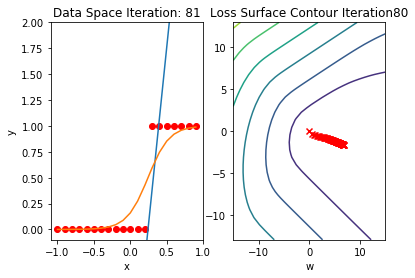

(20, 2)
(2, 1)
(20, 1)
(20, 1)


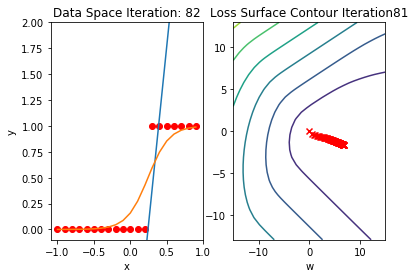

(20, 2)
(2, 1)
(20, 1)
(20, 1)


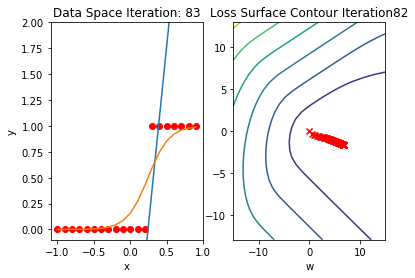

(20, 2)
(2, 1)
(20, 1)
(20, 1)


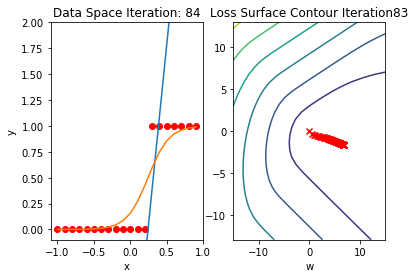

(20, 2)
(2, 1)
(20, 1)
(20, 1)


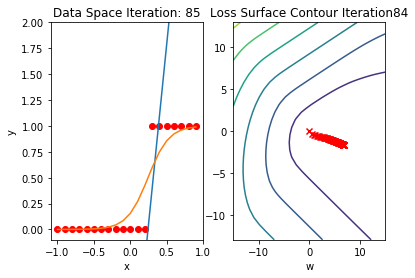

(20, 2)
(2, 1)
(20, 1)
(20, 1)


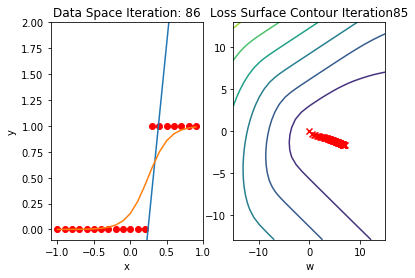

(20, 2)
(2, 1)
(20, 1)
(20, 1)


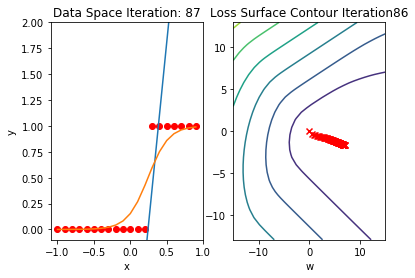

(20, 2)
(2, 1)
(20, 1)
(20, 1)


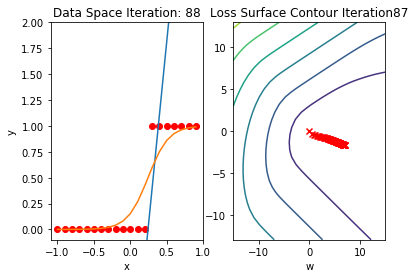

(20, 2)
(2, 1)
(20, 1)
(20, 1)


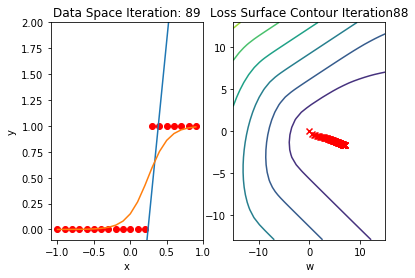

(20, 2)
(2, 1)
(20, 1)
(20, 1)


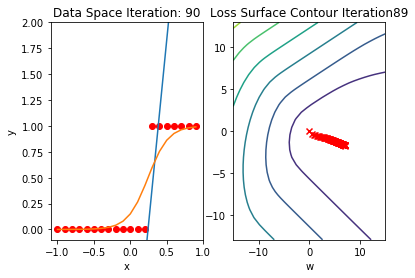

(20, 2)
(2, 1)
(20, 1)
(20, 1)


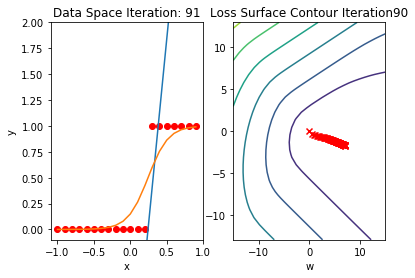

(20, 2)
(2, 1)
(20, 1)
(20, 1)


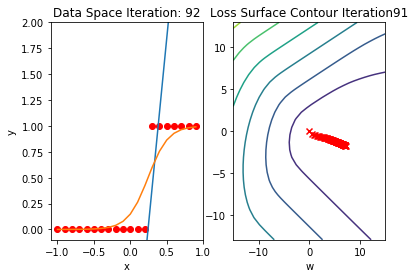

(20, 2)
(2, 1)
(20, 1)
(20, 1)


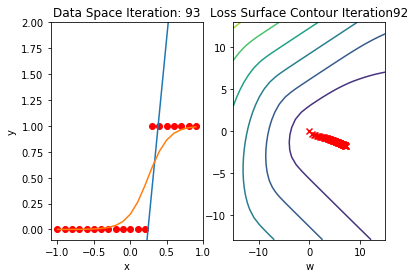

(20, 2)
(2, 1)
(20, 1)
(20, 1)


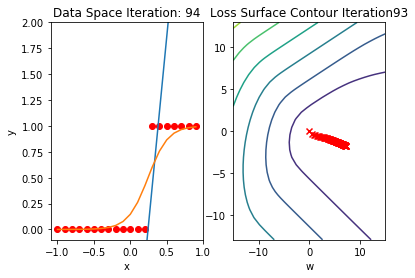

(20, 2)
(2, 1)
(20, 1)
(20, 1)


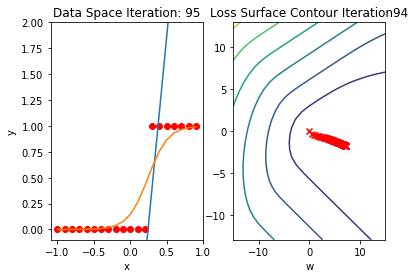

(20, 2)
(2, 1)
(20, 1)
(20, 1)


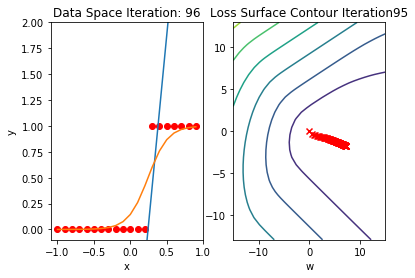

(20, 2)
(2, 1)
(20, 1)
(20, 1)


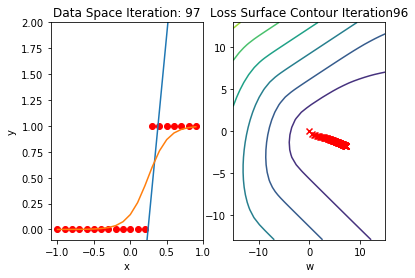

(20, 2)
(2, 1)
(20, 1)
(20, 1)


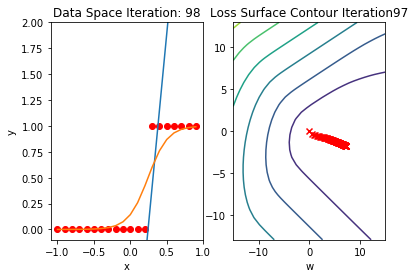

(20, 2)
(2, 1)
(20, 1)
(20, 1)


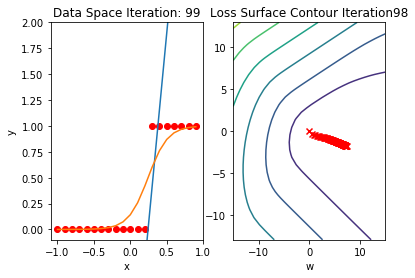

(20, 2)
(2, 1)
(20, 1)
(20, 1)


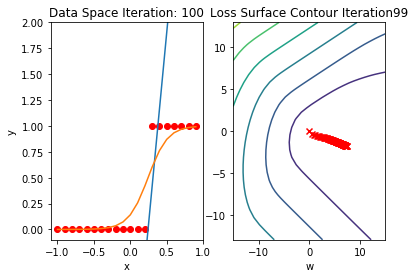

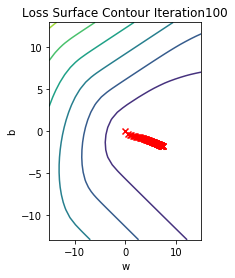

In [17]:
theta_opt, LOSS=train_model(theta_init,100)

Let's plot the loss

Text(27.125, 0.5, 'Cost')

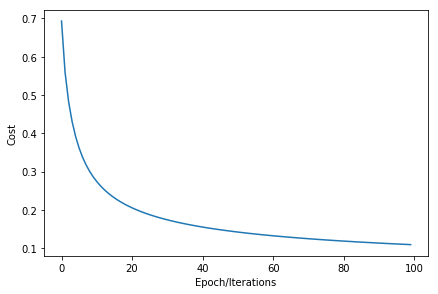

In [20]:
# Plot the variation of loss for each iteration

plt.plot(LOSS)
plt.tight_layout()
plt.xlabel("Epoch/Iterations")
plt.ylabel("Cost")

### Part 2: Student scores dataset
#### Load data

**Question 1: ** The *"exams.txt"* file contains 3 columns that represent the exam 1, exam 2 scores and the result of 100 students (0: Not admitted, 1: Admitted).
- Open this file with a file editor to understand more the data. 
- Load the data in "students_results" variable and check its shape.  
**Hint:** You could use [loadtxt](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.loadtxt.html) function from numpy library.

In [21]:
# Type your code here
students_results = np.loadtxt('exams.txt')

# Type your code here 
print('The shape of the data is',students_results.shape[0])

The shape of the data is 100


#### Extract and visualize features
**Question 2:** 
- Determine the number of student "m" from the input data "students_results".
- Extract exam 1, exam 2 scores and the result columns respectively in "x_1", "x_2" and "Y".  
**Hint:** The shape of "x_1", "x_2" and "Y" arrays should be (m,1) for the following questions and not (m,). You could use [newaxis numpy](https://docs.scipy.org/doc/numpy/reference/arrays.indexing.html#basic-slicing-and-indexing) object to add a new axis of length one.
- Build the matrix X with shape (m,3) that represents 3 features: a column of ones that represents the bias term, a column of x_1 and a column of x_2. 
- Determine the number of features "n" (number of columns of array "X").

**Note:** The two exams score have the same scale [0,20]. Thus, we don't need to do feature normalization.

In [22]:
# Type your code here 
m = students_results.shape[0]          # number of student

#column of ones
a1 = np.ones((students_results.shape[0],1))
# Type your code here 
x_1 = students_results[:,0]# we add np.newaxis in the indexing to obtain an array 
x_1 = x_1[:,np.newaxis]
print(x_1.shape)
x_2 = students_results[:,1] # with shape (100,1) instead of (100,)
x_2 = x_2[:,np.newaxis]
print(x_2.shape)
v=np.concatenate((a1,x_1),axis=1)
X = np.concatenate((v,x_2),axis=1)
print(X.shape)
# Type your code here 
n = 3               # number of features
# Type your code here 
Y = students_results[:,2]  # we add np.newaxis in the indexing to obtain an array with shape (100,1) instead of (100,)
Y = Y[:,np.newaxis]
print(Y.shape)

(100, 1)
(100, 1)
(100, 3)
(100, 1)


Let's visualize the features

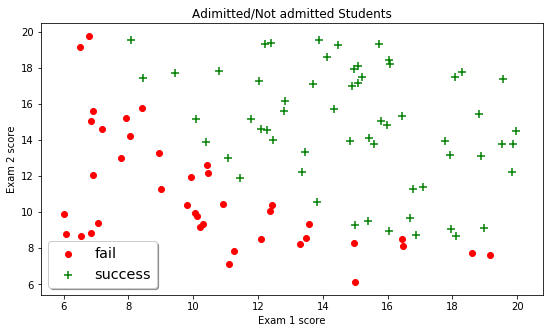

In [23]:
%matplotlib notebook
%matplotlib inline
# visualize data
plt.figure("Visualize students results",figsize=(9,5))
plt.scatter(x_1[Y==0], x_2[Y==0],  color='red',label='fail')
plt.scatter(x_1[Y==1], x_2[Y==1],  color='green',marker='+',s=80, label='success')
plt.xlabel('Exam 1 score')
plt.ylabel('Exam 2 score')
plt.title('Adimitted/Not admitted Students')
legend = plt.legend(loc='lower left', shadow=True, fontsize='x-large')

Let us define the learning rate <code>lr</code>:  

In [24]:
lr = 0.01

Now, we initialize the model parameter to learn.

In [25]:
theta_init=np.array([[0],[0],[0]],dtype=float)

**Question 3:** Evaluate the MSE cost function at theta_init

In [26]:
# Type your code here 
yhat = predict(X,theta_init)
cost = MSE_cost(yhat, Y)
print("MSE cost function for theta_init is",cost)

MSE cost function for theta_init is 1250.0


Let's visualize the loss when we use the MSE cost

Minimum value of MSE cost function detected on the plot:  0.13000786172948764
Value of theta_1, theta_2 that minimize the MSE cost function:  0.1020408163265305 -0.1020408163265305


Text(0.5, 0, 'Cost Funtion')

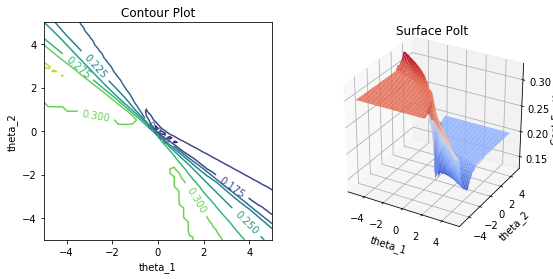

In [27]:
theta_1 = np.linspace(-5,5,50) # you could also use: theta_1 = np.arange(100, 300, 2)
theta_2 = np.linspace(-5,5,50)    # you could also use: theta_2 = np.arange(-1, 5, 0.05)
theta_1, theta_2 = np.meshgrid(theta_1, theta_2)
Theta=np.concatenate((np.zeros((*theta_1.shape,1)),theta_1[:,:,np.newaxis],theta_2[:,:,np.newaxis]),axis=-1)

Thetabis=Theta.reshape((Theta.shape[0]*Theta.shape[1],Theta.shape[2]))
#Zbis =  cost(Thetabis.transpose())
#Z=Zbis.reshape((Theta.shape[0],Theta.shape[1]))
Z =  1/(2*m)*np.sum((sigmoid(np.dot(Theta,X.transpose()))-np.tile(Y[np.newaxis,np.newaxis,:,0],(*theta_1.shape,1)))**2,axis=-1)

print("Minimum value of MSE cost function detected on the plot: ",np.min(Z))
print("Value of theta_1, theta_2 that minimize the MSE cost function: ",theta_1[np.argmin(np.min(Z,axis=1)),np.argmin(np.min(Z,axis=0))],theta_2[np.argmin(np.min(Z,axis=1)),np.argmin(np.min(Z,axis=0))])


# the contour plot (projection of 3d plot on 2d plan)
fig=plt.figure('Contour and Surface Plots for MSE cost function',figsize=(9,4))
ax = fig.add_subplot(1, 2, 1)
ctr = plt.contour(theta_1, theta_2, Z)
plt.clabel(ctr, inline=1, fontsize=10)
#ax.imshow(Z,cmap=cm.coolwarm)
ax.set_title('Contour Plot')
ax.set_xlabel('theta_1')
ax.set_ylabel('theta_2')

# the surface plot (3d plot)
ax=fig.add_subplot(1, 2, 2,projection='3d')
ax.plot_surface(theta_1,theta_2,Z,rstride=1,cstride=1,cmap=cm.coolwarm,linewidth=1,antialiased=True)

ax.set_title('Surface Polt')
ax.set_xlabel('theta_1')
ax.set_ylabel('theta_2')
ax.set_zlabel('Cost Funtion')

**Question 4:** Evaluate the NLL cost function at theta_init

In [28]:
# Type your code here
cost = NLL_cost(yhat, Y)
print("NLL cost function for theta_init is ",cost)

NLL cost function for theta_init is  0.6931471805599453


Let's visualize the loss when we use the NLL cost

Minimum value of cost function detected on the plot:  0.715014741172373
Value of theta_1, theta_2 that minimize the cost function:  0.1020408163265305 -0.1020408163265305


Text(0.5, 0, 'Cost Funtion')

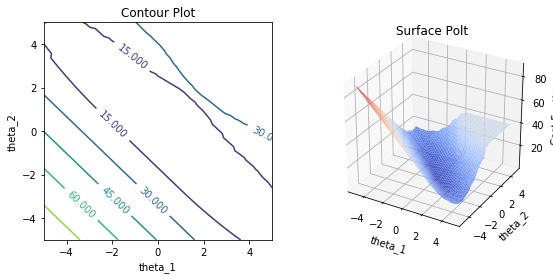

In [29]:
theta_1 = np.linspace(-5,5,50) # you could also use: theta_1 = np.arange(100, 300, 2)
theta_2 = np.linspace(-5,5,50)    # you could also use: theta_2 = np.arange(-1, 5, 0.05)
theta_1, theta_2 = np.meshgrid(theta_1, theta_2)
Theta=np.concatenate((np.zeros((*theta_1.shape,1)),theta_1[:,:,np.newaxis],theta_2[:,:,np.newaxis]),axis=-1)
Z=np.zeros(theta_1.shape)
for i in range(theta_1.shape[0]):
    for j in range(theta_1.shape[1]):
        for k in range(m):
            if (Y[k,0]==1):
                if (sigmoid(np.dot(Theta[i,j,:],X[k,:]))==0):
                    Z[i,j]+=100
                else:
                    Z[i,j]-=np.log(sigmoid(np.dot(Theta[i,j,:],X[k,:])))
            else:
                if (sigmoid(np.dot(Theta[i,j,:],X[k,:]))==1):
                    Z[i,j]+=100
                else:
                    Z[i,j]-=np.log(1-sigmoid(np.dot(Theta[i,j,:],X[k,:])))
Z=Z/m  

print("Minimum value of cost function detected on the plot: ",np.min(Z))
print("Value of theta_1, theta_2 that minimize the cost function: ",theta_1[np.argmin(np.min(Z,axis=1)),np.argmin(np.min(Z,axis=0))],theta_2[np.argmin(np.min(Z,axis=1)),np.argmin(np.min(Z,axis=0))])


# the contour plot (projection of 3d plot on 2d plan)
fig=plt.figure('Contour and Surface Plots Logistic cost function',figsize=(9,4))
ax = fig.add_subplot(1, 2, 1)
ctr = plt.contour(theta_1, theta_2, Z)
plt.clabel(ctr, inline=1, fontsize=10)
#ax.imshow(Z,cmap=cm.coolwarm)
ax.set_title('Contour Plot')
ax.set_xlabel('theta_1')
ax.set_ylabel('theta_2')

# the surface plot (3d plot)
ax=fig.add_subplot(1, 2, 2,projection='3d')
ax.plot_surface(theta_1,theta_2,Z,rstride=1,cstride=1,cmap=cm.coolwarm,linewidth=1,antialiased=True)
ax.set_title('Surface Polt')
ax.set_xlabel('theta_1')
ax.set_ylabel('theta_2')
ax.set_zlabel('Cost Funtion')

**Question 5:** Evaluate the gradient of the NLL cost function at theta_init

In [30]:
# Type your code here
grad= grad_cost_func(theta_init, X, Y)
print("Gradient for theta_init is : ",grad)

Gradient for theta_init is :  [[-0.1    ]
 [-2.40185]
 [-2.2527 ]]


**Question 6:** Define a function for training the model by the gradient descent method using the following steps:
- Make a prediction of your data
- Calculate the loss 
- Compute the gradient of the loss
- Update the $\theta$ parameters.

In [31]:
# Define a function for train the model

def train_model(theta,iter,lr):
    LOSS2=[]
    for epoch in range (iter):
        
        # make the prediction
        # Type your code here
        print(X.shape)
        print(theta.shape)
        Yhat = predict(X,theta)
        print(Yhat.shape)
        print(Y.shape)
        
        # calculate the cost
        # Type your code here
        loss = NLL_cost(Yhat, Y)
        
        # store the loss into list
        LOSS2.append(loss)
        
        get_surface.set_para_loss(theta[1],theta[0], LOSS)
        
        # Compute gradient of the loss
        # Type your code here
        grad=grad_cost_func(theta, X, Y)
        
        
        # update the theta_1 parameter
        # Type your code here
        theta = theta - lr*grad
        
        if iter % 20 == 0:
            get_surface.plot_ps()
        
    return theta, LOSS2

#### Selecting learning rate
Execute the following code and visualize learning curves that describe the decrease of the cost function during the gradient descent iterations.

**Question 7: ** 
- Set the learning rate "alpha" to the best value that helps to decrease quickly the cost function. 

** Note:** The execution of this block of code could take several seconds.

(100, 3)
(3, 1)
(100, 1)
(100, 1)


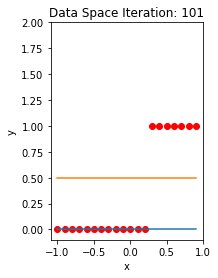

(100, 3)
(3, 1)
(100, 1)
(100, 1)


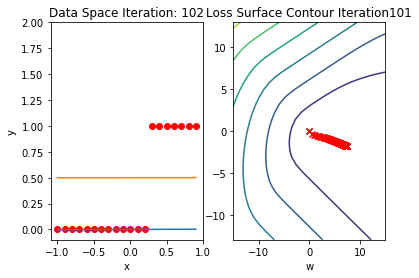

(100, 3)
(3, 1)
(100, 1)
(100, 1)


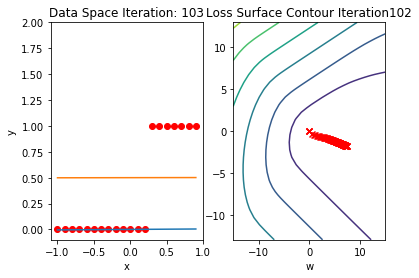

(100, 3)
(3, 1)
(100, 1)
(100, 1)


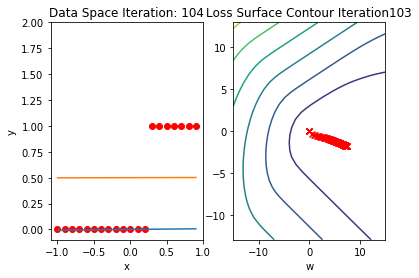

(100, 3)
(3, 1)
(100, 1)
(100, 1)


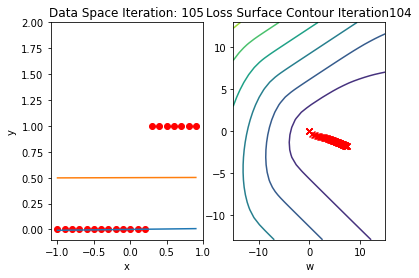

(100, 3)
(3, 1)
(100, 1)
(100, 1)


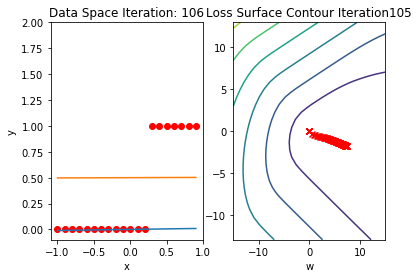

(100, 3)
(3, 1)
(100, 1)
(100, 1)


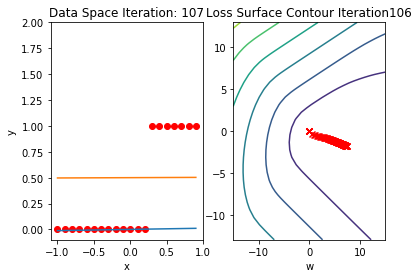

(100, 3)
(3, 1)
(100, 1)
(100, 1)


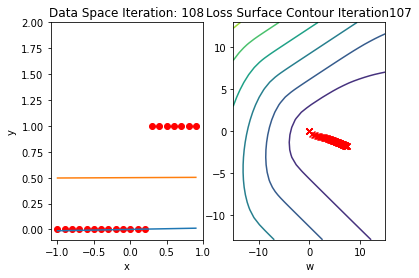

(100, 3)
(3, 1)
(100, 1)
(100, 1)


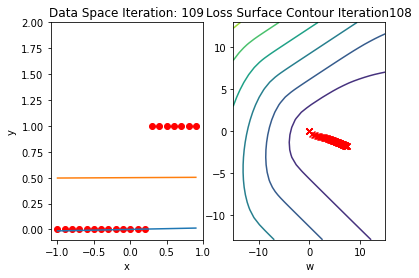

(100, 3)
(3, 1)
(100, 1)
(100, 1)


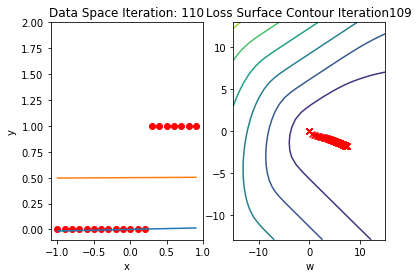

(100, 3)
(3, 1)
(100, 1)
(100, 1)


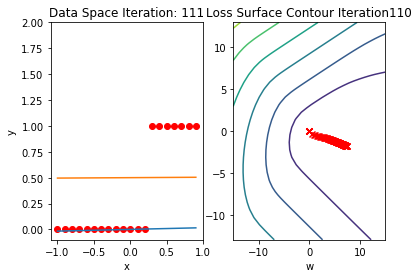

(100, 3)
(3, 1)
(100, 1)
(100, 1)


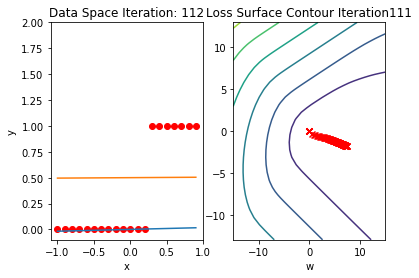

(100, 3)
(3, 1)
(100, 1)
(100, 1)


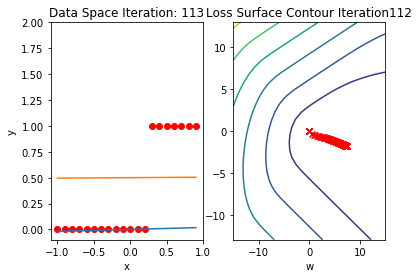

(100, 3)
(3, 1)
(100, 1)
(100, 1)


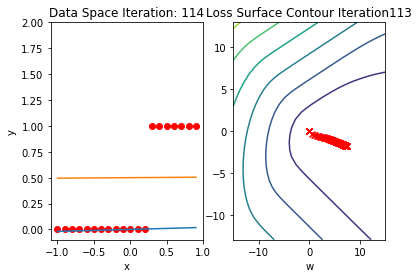

(100, 3)
(3, 1)
(100, 1)
(100, 1)


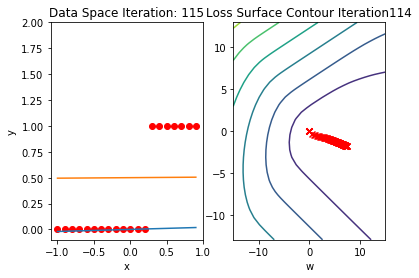

(100, 3)
(3, 1)
(100, 1)
(100, 1)


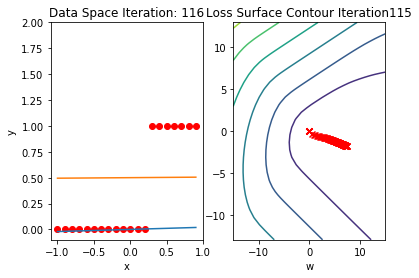

(100, 3)
(3, 1)
(100, 1)
(100, 1)


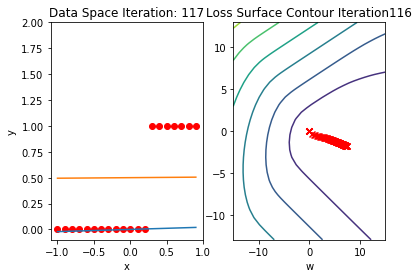

(100, 3)
(3, 1)
(100, 1)
(100, 1)


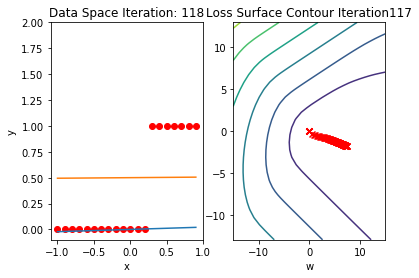

(100, 3)
(3, 1)
(100, 1)
(100, 1)


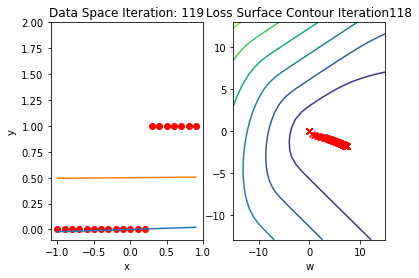

(100, 3)
(3, 1)
(100, 1)
(100, 1)


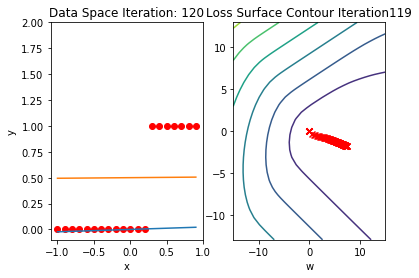

(100, 3)
(3, 1)
(100, 1)
(100, 1)


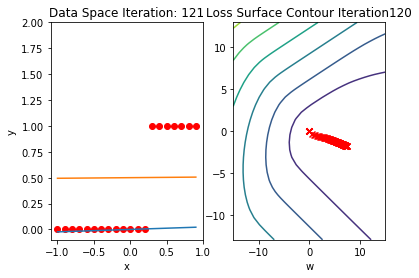

(100, 3)
(3, 1)
(100, 1)
(100, 1)


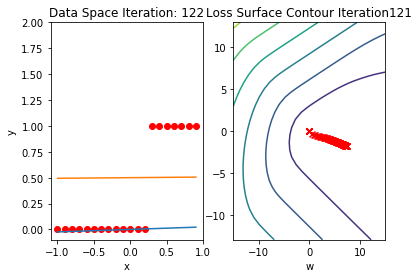

(100, 3)
(3, 1)
(100, 1)
(100, 1)


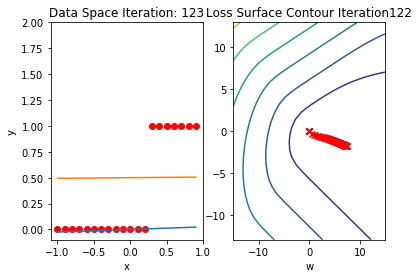

(100, 3)
(3, 1)
(100, 1)
(100, 1)


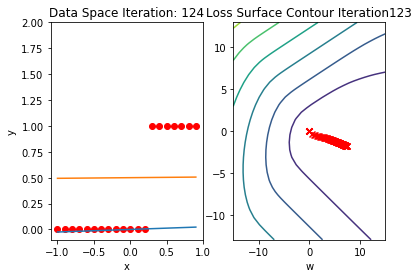

(100, 3)
(3, 1)
(100, 1)
(100, 1)


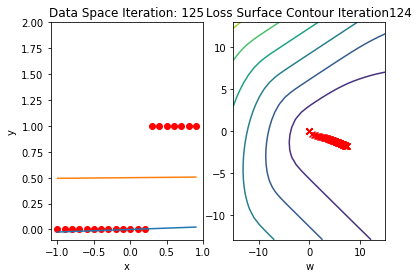

(100, 3)
(3, 1)
(100, 1)
(100, 1)


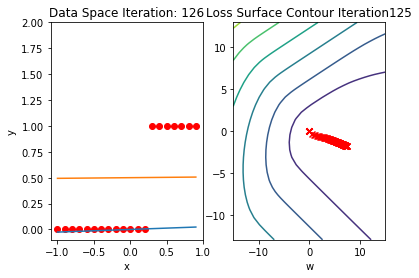

(100, 3)
(3, 1)
(100, 1)
(100, 1)


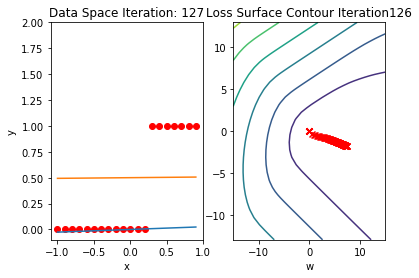

(100, 3)
(3, 1)
(100, 1)
(100, 1)


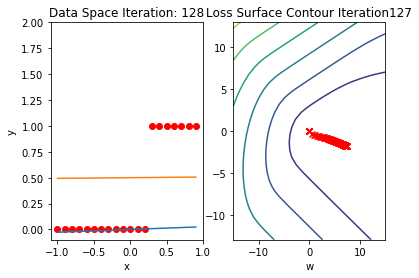

(100, 3)
(3, 1)
(100, 1)
(100, 1)


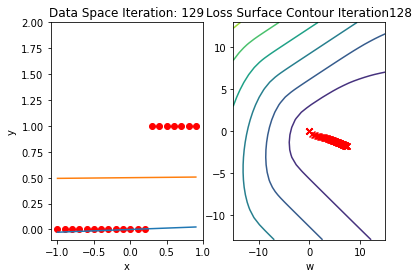

(100, 3)
(3, 1)
(100, 1)
(100, 1)


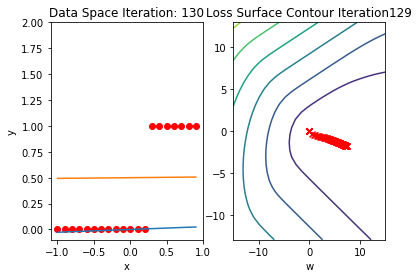

(100, 3)
(3, 1)
(100, 1)
(100, 1)


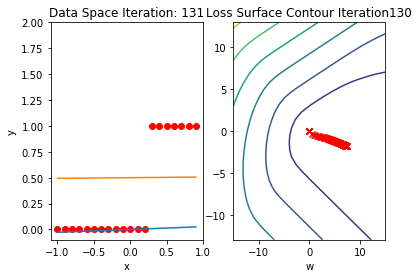

(100, 3)
(3, 1)
(100, 1)
(100, 1)


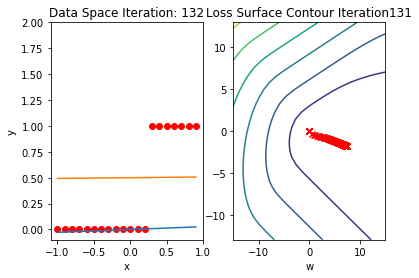

(100, 3)
(3, 1)
(100, 1)
(100, 1)


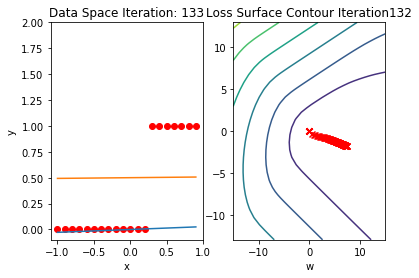

(100, 3)
(3, 1)
(100, 1)
(100, 1)


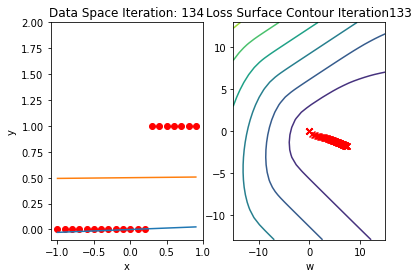

(100, 3)
(3, 1)
(100, 1)
(100, 1)


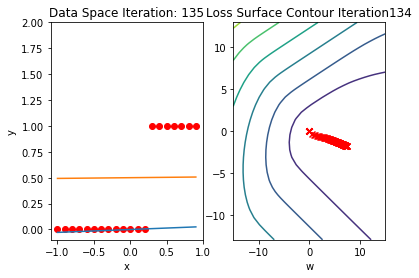

(100, 3)
(3, 1)
(100, 1)
(100, 1)


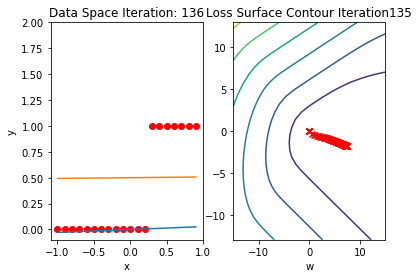

(100, 3)
(3, 1)
(100, 1)
(100, 1)


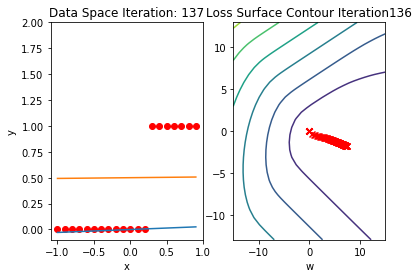

(100, 3)
(3, 1)
(100, 1)
(100, 1)


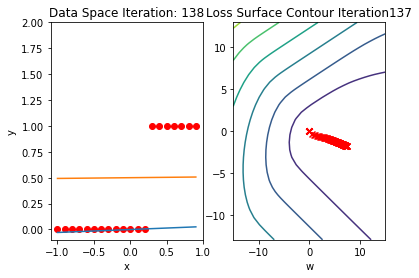

(100, 3)
(3, 1)
(100, 1)
(100, 1)


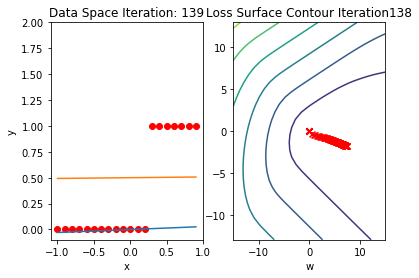

(100, 3)
(3, 1)
(100, 1)
(100, 1)


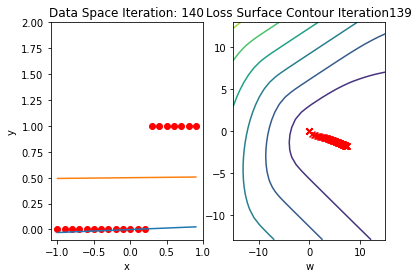

(100, 3)
(3, 1)
(100, 1)
(100, 1)


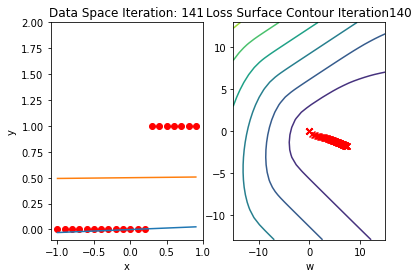

(100, 3)
(3, 1)
(100, 1)
(100, 1)


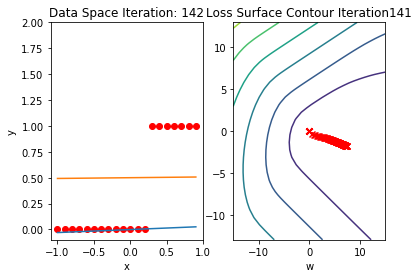

(100, 3)
(3, 1)
(100, 1)
(100, 1)


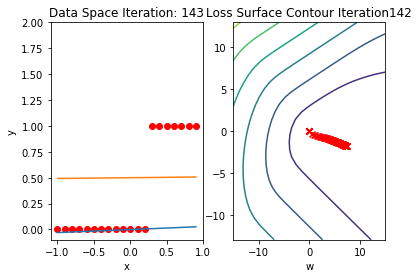

(100, 3)
(3, 1)
(100, 1)
(100, 1)


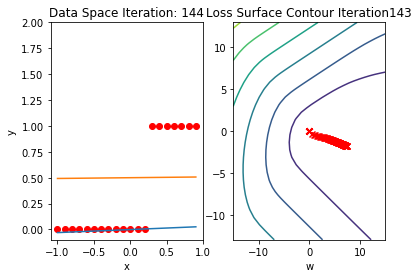

(100, 3)
(3, 1)
(100, 1)
(100, 1)


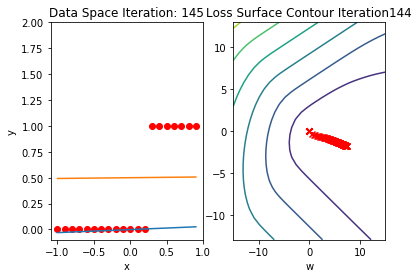

(100, 3)
(3, 1)
(100, 1)
(100, 1)


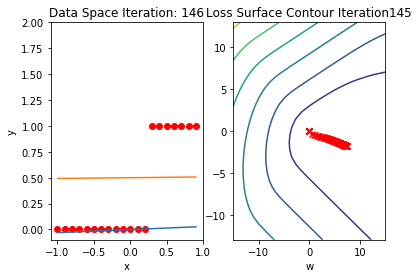

(100, 3)
(3, 1)
(100, 1)
(100, 1)


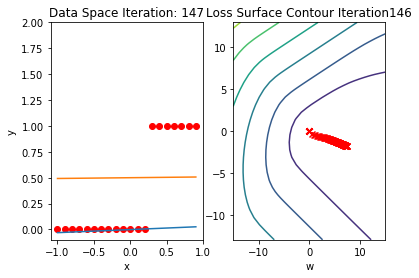

(100, 3)
(3, 1)
(100, 1)
(100, 1)


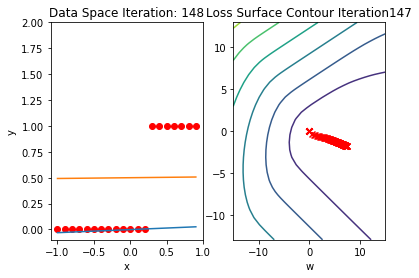

(100, 3)
(3, 1)
(100, 1)
(100, 1)


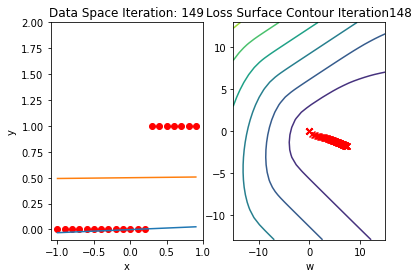

(100, 3)
(3, 1)
(100, 1)
(100, 1)


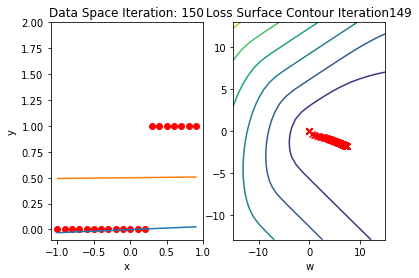

(100, 3)
(3, 1)
(100, 1)
(100, 1)


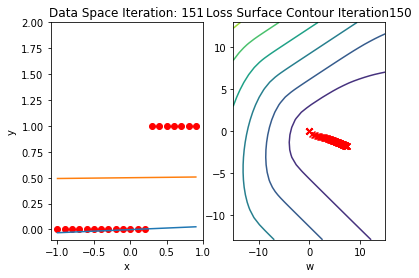

(100, 3)
(3, 1)
(100, 1)
(100, 1)


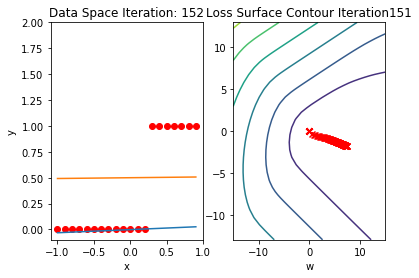

(100, 3)
(3, 1)
(100, 1)
(100, 1)


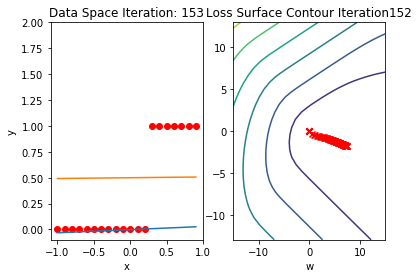

(100, 3)
(3, 1)
(100, 1)
(100, 1)


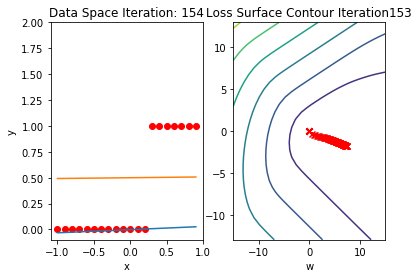

(100, 3)
(3, 1)
(100, 1)
(100, 1)


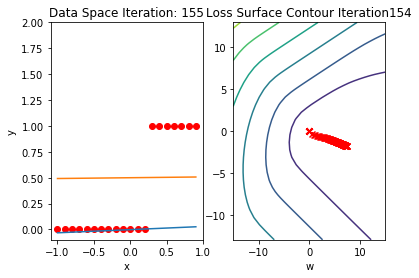

(100, 3)
(3, 1)
(100, 1)
(100, 1)


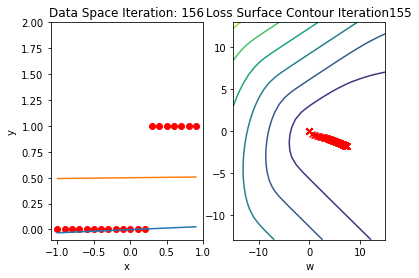

(100, 3)
(3, 1)
(100, 1)
(100, 1)


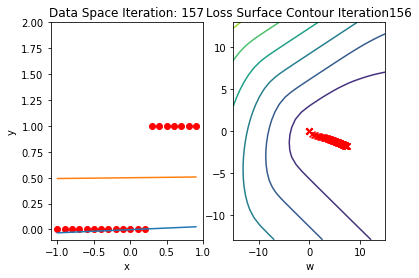

(100, 3)
(3, 1)
(100, 1)
(100, 1)


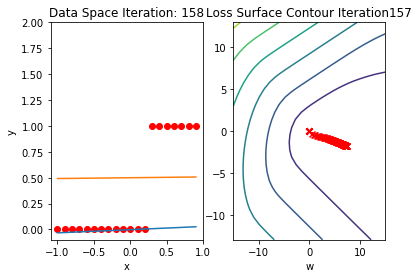

(100, 3)
(3, 1)
(100, 1)
(100, 1)


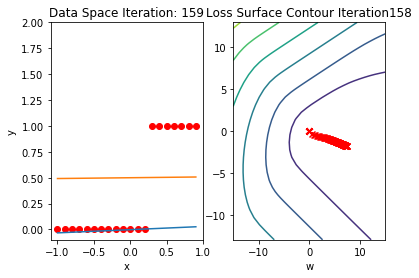

(100, 3)
(3, 1)
(100, 1)
(100, 1)


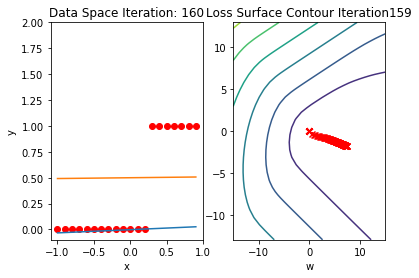

(100, 3)
(3, 1)
(100, 1)
(100, 1)


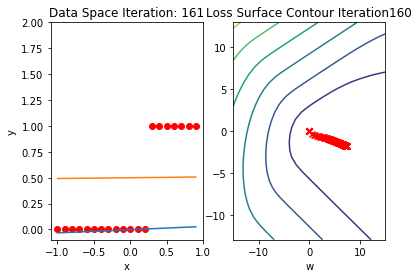

(100, 3)
(3, 1)
(100, 1)
(100, 1)


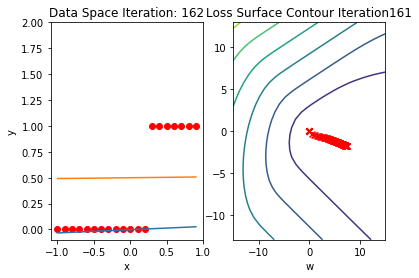

(100, 3)
(3, 1)
(100, 1)
(100, 1)


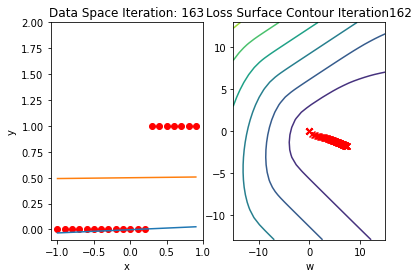

(100, 3)
(3, 1)
(100, 1)
(100, 1)


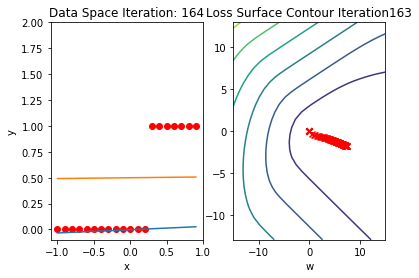

(100, 3)
(3, 1)
(100, 1)
(100, 1)


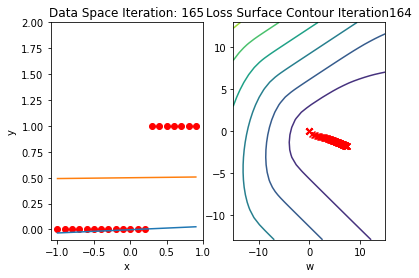

(100, 3)
(3, 1)
(100, 1)
(100, 1)


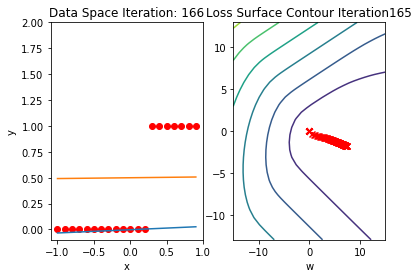

(100, 3)
(3, 1)
(100, 1)
(100, 1)


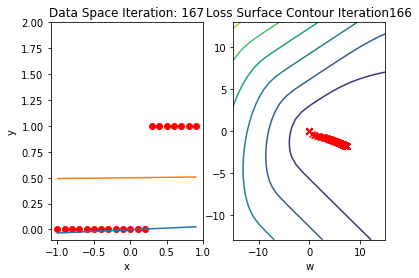

(100, 3)
(3, 1)
(100, 1)
(100, 1)


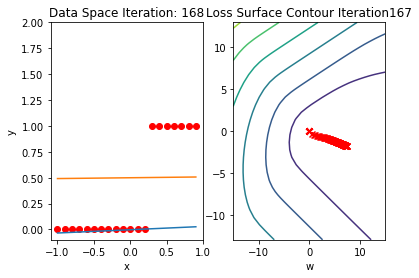

(100, 3)
(3, 1)
(100, 1)
(100, 1)


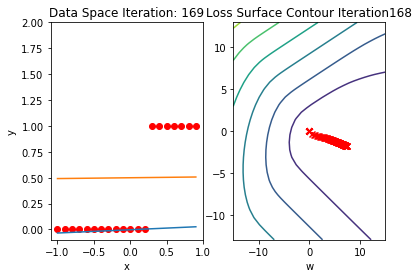

(100, 3)
(3, 1)
(100, 1)
(100, 1)


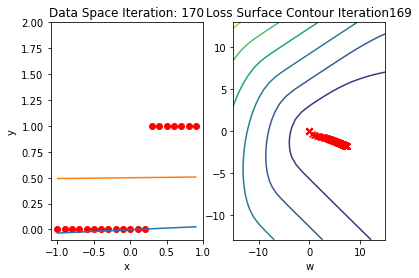

(100, 3)
(3, 1)
(100, 1)
(100, 1)


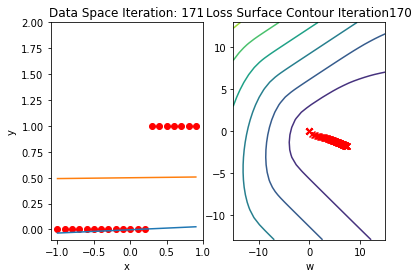

(100, 3)
(3, 1)
(100, 1)
(100, 1)


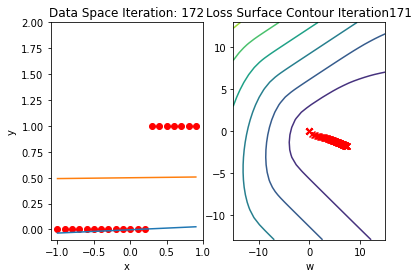

(100, 3)
(3, 1)
(100, 1)
(100, 1)


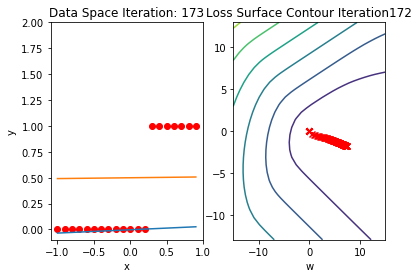

(100, 3)
(3, 1)
(100, 1)
(100, 1)


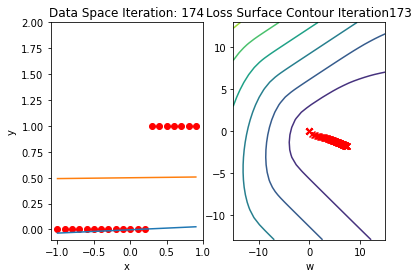

(100, 3)
(3, 1)
(100, 1)
(100, 1)


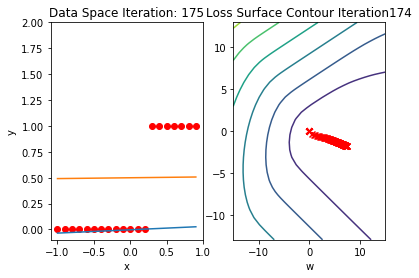

(100, 3)
(3, 1)
(100, 1)
(100, 1)


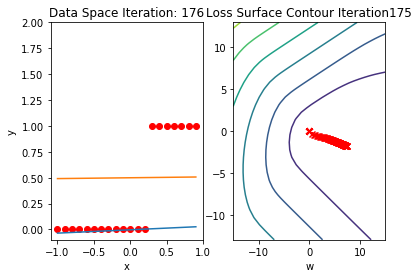

(100, 3)
(3, 1)
(100, 1)
(100, 1)


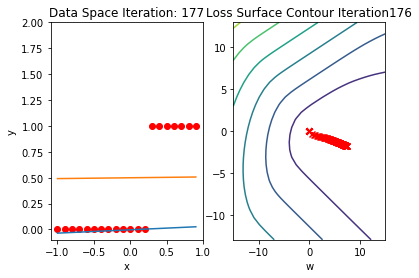

(100, 3)
(3, 1)
(100, 1)
(100, 1)


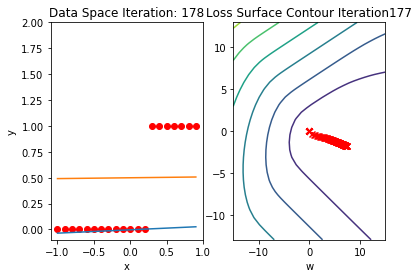

(100, 3)
(3, 1)
(100, 1)
(100, 1)


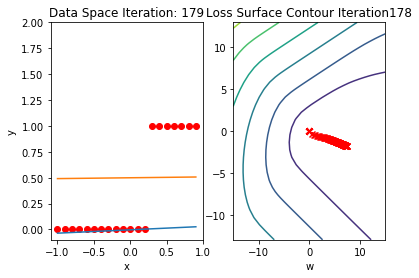

(100, 3)
(3, 1)
(100, 1)
(100, 1)


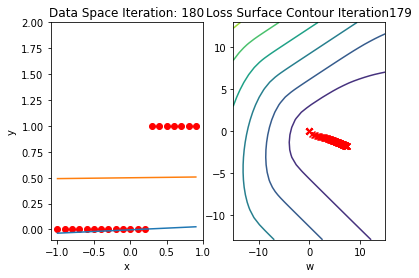

(100, 3)
(3, 1)
(100, 1)
(100, 1)


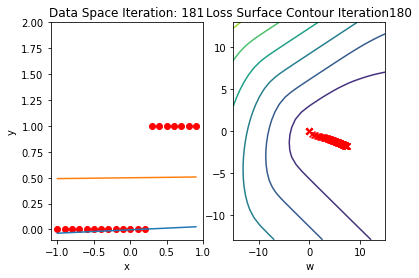

(100, 3)
(3, 1)
(100, 1)
(100, 1)


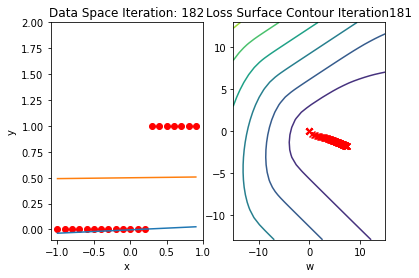

(100, 3)
(3, 1)
(100, 1)
(100, 1)


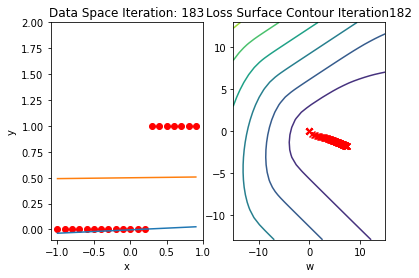

(100, 3)
(3, 1)
(100, 1)
(100, 1)


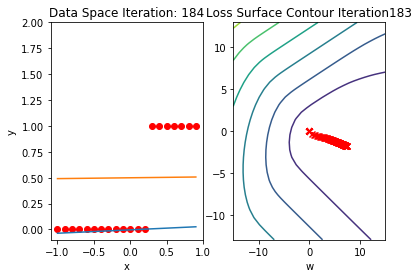

(100, 3)
(3, 1)
(100, 1)
(100, 1)


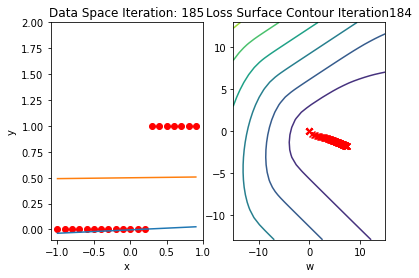

(100, 3)
(3, 1)
(100, 1)
(100, 1)


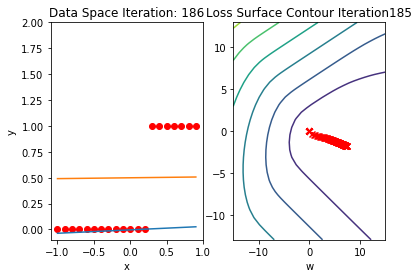

(100, 3)
(3, 1)
(100, 1)
(100, 1)


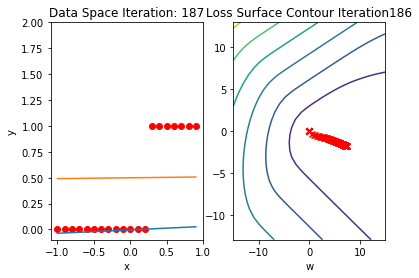

(100, 3)
(3, 1)
(100, 1)
(100, 1)


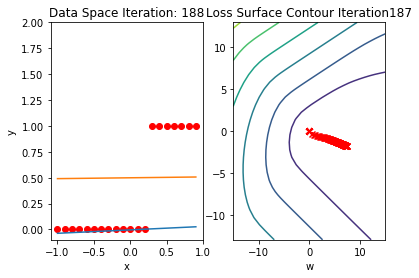

(100, 3)
(3, 1)
(100, 1)
(100, 1)


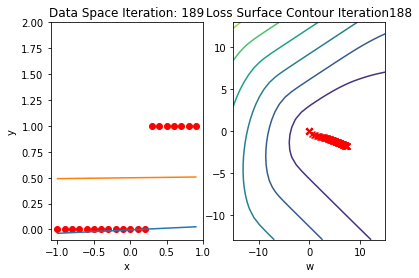

(100, 3)
(3, 1)
(100, 1)
(100, 1)


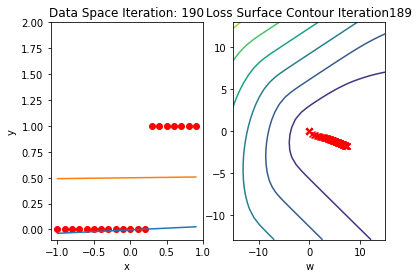

(100, 3)
(3, 1)
(100, 1)
(100, 1)


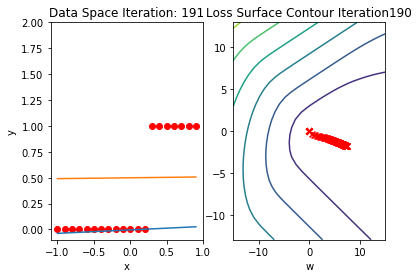

(100, 3)
(3, 1)
(100, 1)
(100, 1)


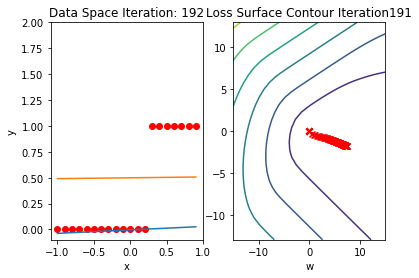

(100, 3)
(3, 1)
(100, 1)
(100, 1)


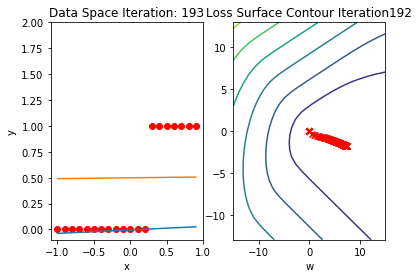

(100, 3)
(3, 1)
(100, 1)
(100, 1)


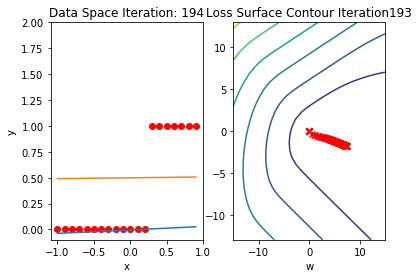

(100, 3)
(3, 1)
(100, 1)
(100, 1)


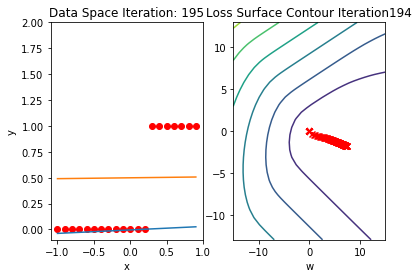

(100, 3)
(3, 1)
(100, 1)
(100, 1)


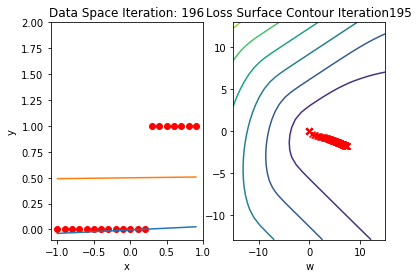

(100, 3)
(3, 1)
(100, 1)
(100, 1)


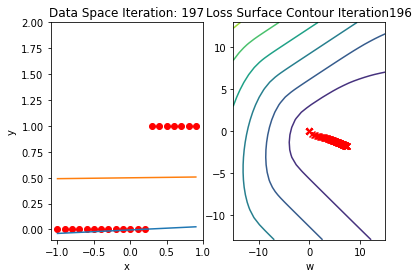

(100, 3)
(3, 1)
(100, 1)
(100, 1)


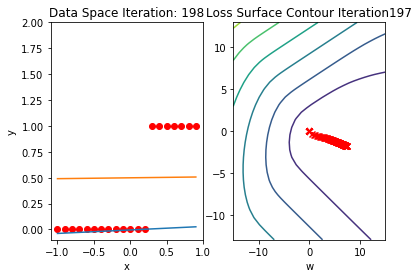

(100, 3)
(3, 1)
(100, 1)
(100, 1)


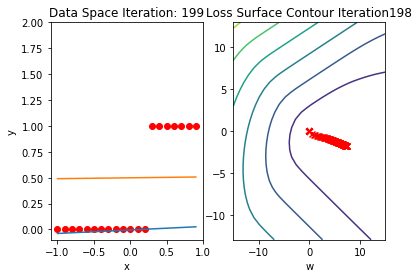

(100, 3)
(3, 1)
(100, 1)
(100, 1)


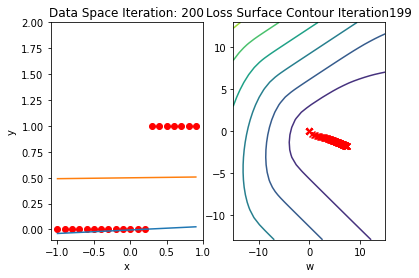

(100, 3)
(3, 1)
(100, 1)
(100, 1)


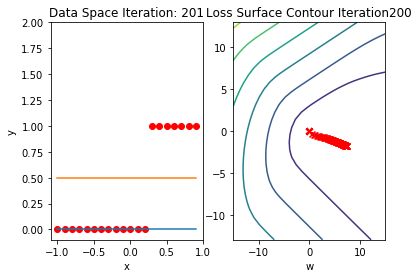

(100, 3)
(3, 1)
(100, 1)
(100, 1)


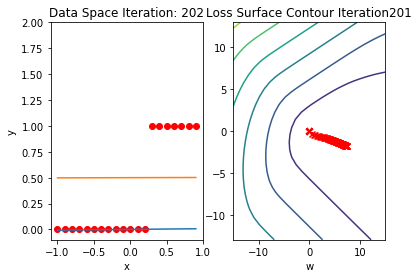

(100, 3)
(3, 1)
(100, 1)
(100, 1)


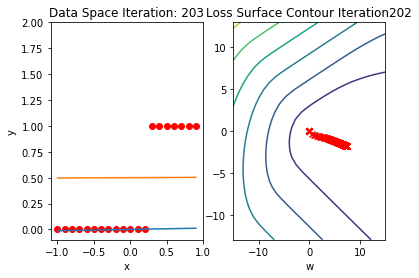

(100, 3)
(3, 1)
(100, 1)
(100, 1)


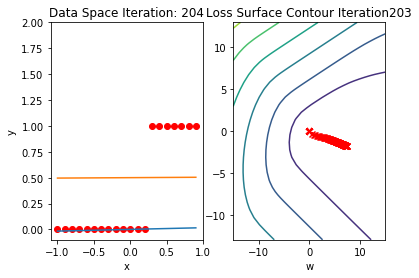

(100, 3)
(3, 1)
(100, 1)
(100, 1)


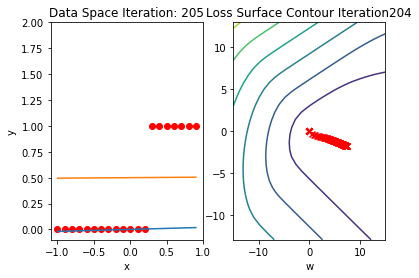

(100, 3)
(3, 1)
(100, 1)
(100, 1)


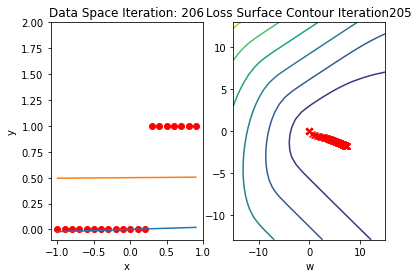

(100, 3)
(3, 1)
(100, 1)
(100, 1)


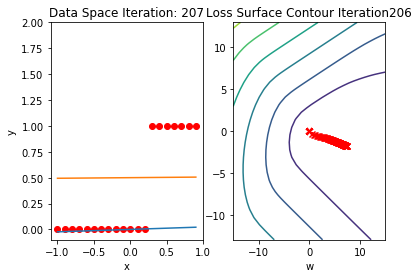

(100, 3)
(3, 1)
(100, 1)
(100, 1)


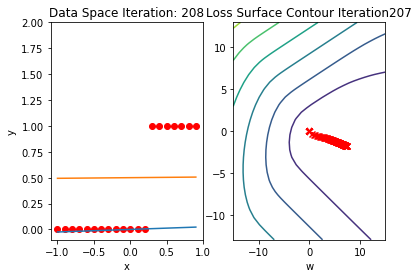

(100, 3)
(3, 1)
(100, 1)
(100, 1)


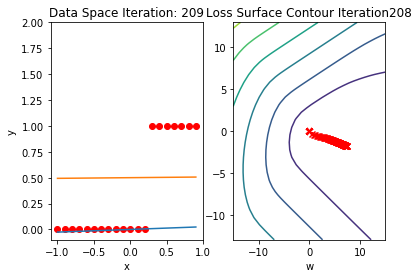

(100, 3)
(3, 1)
(100, 1)
(100, 1)


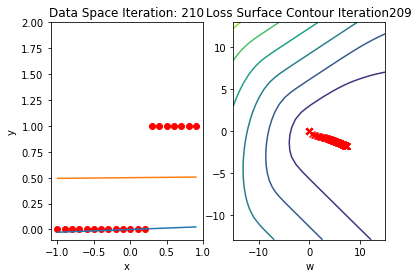

(100, 3)
(3, 1)
(100, 1)
(100, 1)


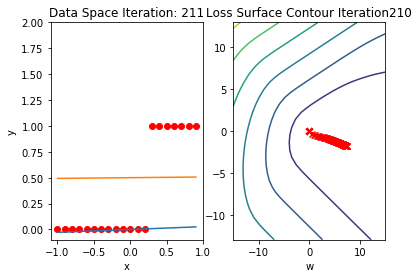

(100, 3)
(3, 1)
(100, 1)
(100, 1)


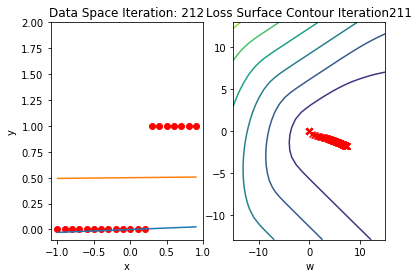

(100, 3)
(3, 1)
(100, 1)
(100, 1)


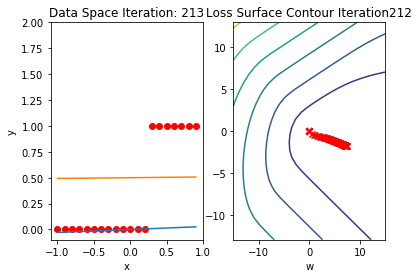

(100, 3)
(3, 1)
(100, 1)
(100, 1)


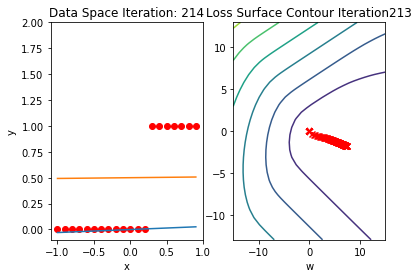

(100, 3)
(3, 1)
(100, 1)
(100, 1)


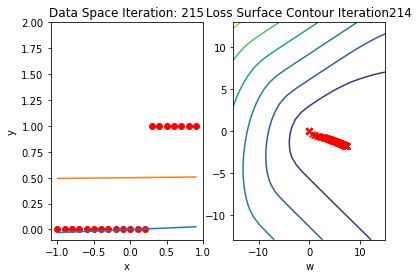

(100, 3)
(3, 1)
(100, 1)
(100, 1)


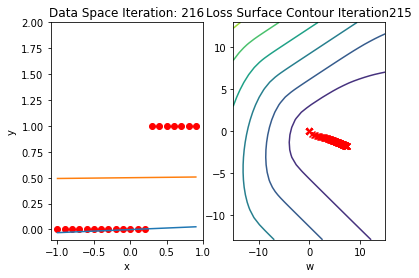

(100, 3)
(3, 1)
(100, 1)
(100, 1)


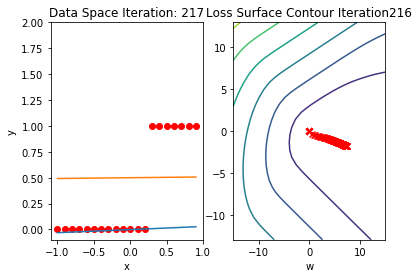

(100, 3)
(3, 1)
(100, 1)
(100, 1)


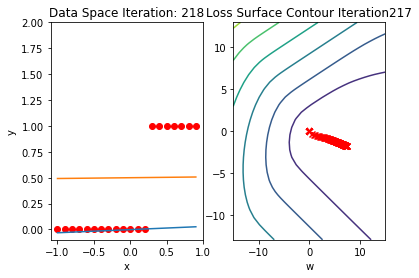

(100, 3)
(3, 1)
(100, 1)
(100, 1)


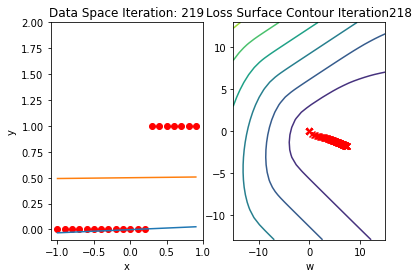

(100, 3)
(3, 1)
(100, 1)
(100, 1)


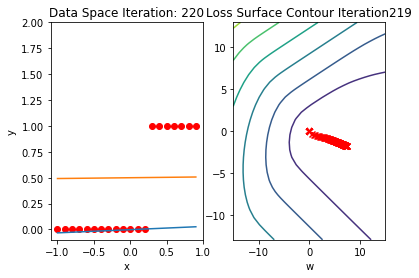

(100, 3)
(3, 1)
(100, 1)
(100, 1)


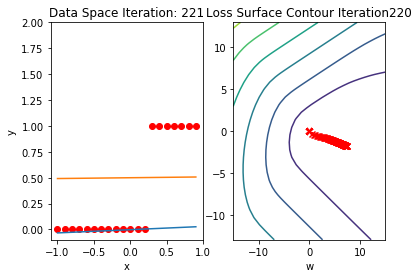

(100, 3)
(3, 1)
(100, 1)
(100, 1)


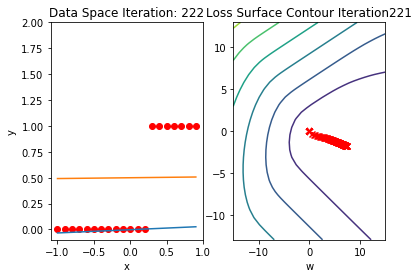

(100, 3)
(3, 1)
(100, 1)
(100, 1)


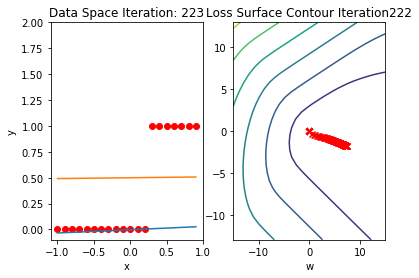

(100, 3)
(3, 1)
(100, 1)
(100, 1)


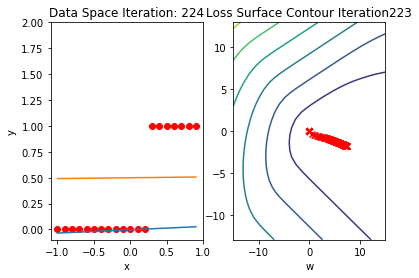

(100, 3)
(3, 1)
(100, 1)
(100, 1)


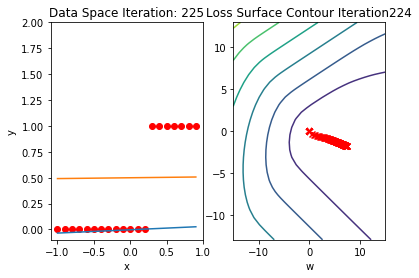

(100, 3)
(3, 1)
(100, 1)
(100, 1)


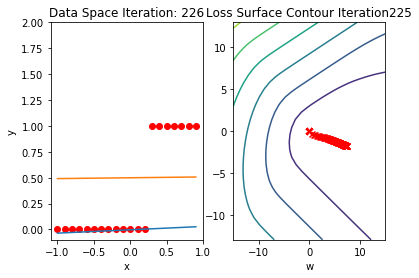

(100, 3)
(3, 1)
(100, 1)
(100, 1)


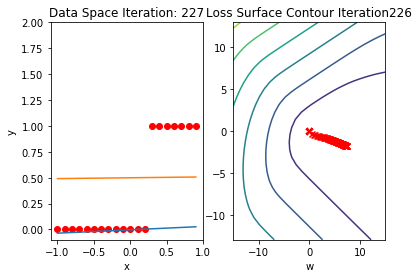

(100, 3)
(3, 1)
(100, 1)
(100, 1)


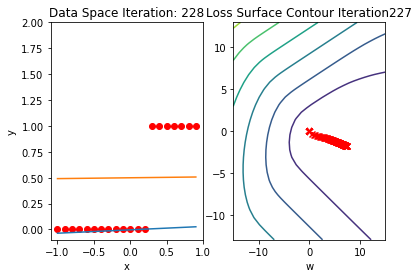

(100, 3)
(3, 1)
(100, 1)
(100, 1)


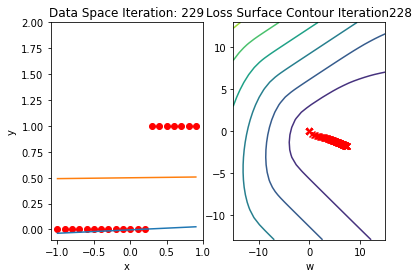

(100, 3)
(3, 1)
(100, 1)
(100, 1)


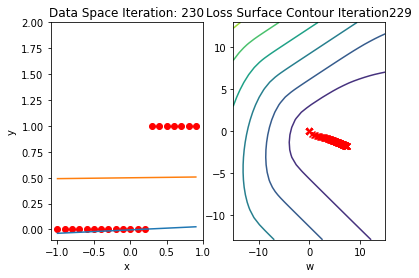

(100, 3)
(3, 1)
(100, 1)
(100, 1)


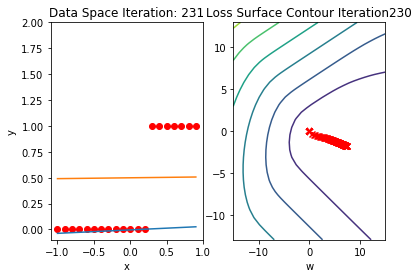

(100, 3)
(3, 1)
(100, 1)
(100, 1)


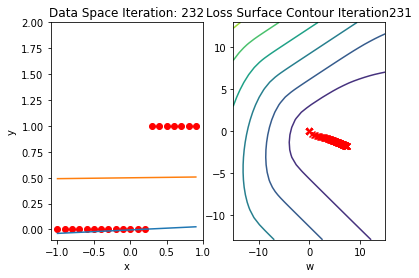

(100, 3)
(3, 1)
(100, 1)
(100, 1)


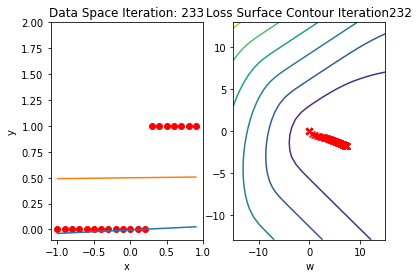

(100, 3)
(3, 1)
(100, 1)
(100, 1)


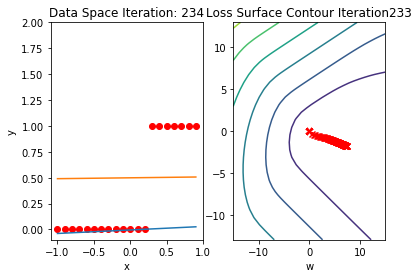

(100, 3)
(3, 1)
(100, 1)
(100, 1)


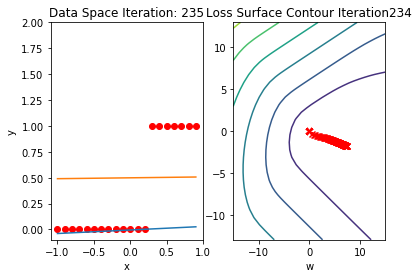

(100, 3)
(3, 1)
(100, 1)
(100, 1)


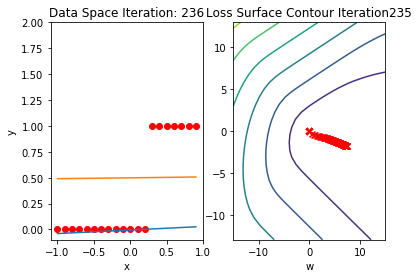

(100, 3)
(3, 1)
(100, 1)
(100, 1)


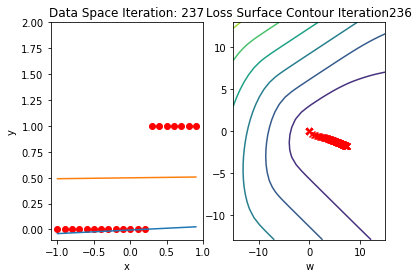

(100, 3)
(3, 1)
(100, 1)
(100, 1)


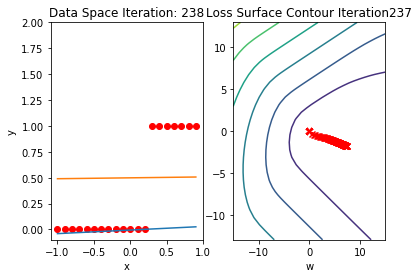

(100, 3)
(3, 1)
(100, 1)
(100, 1)


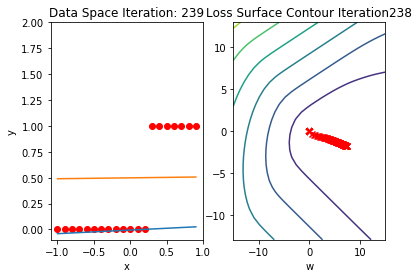

(100, 3)
(3, 1)
(100, 1)
(100, 1)


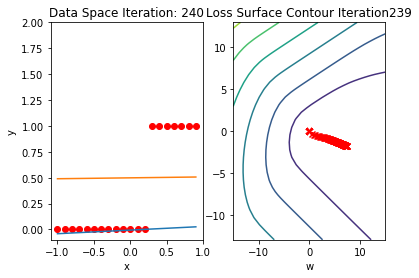

(100, 3)
(3, 1)
(100, 1)
(100, 1)


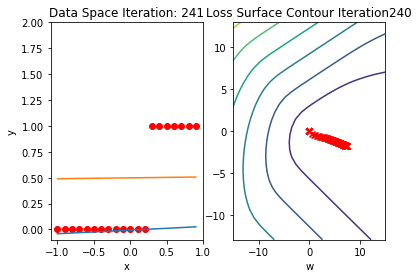

(100, 3)
(3, 1)
(100, 1)
(100, 1)


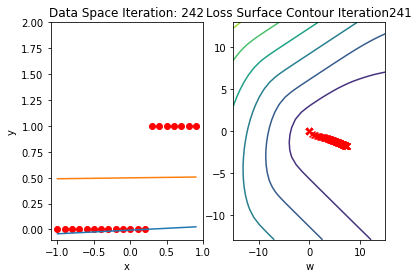

(100, 3)
(3, 1)
(100, 1)
(100, 1)


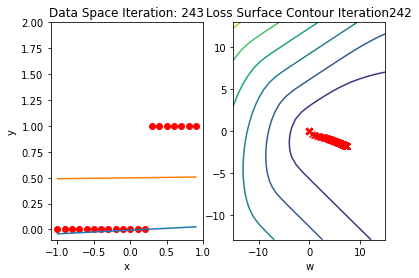

(100, 3)
(3, 1)
(100, 1)
(100, 1)


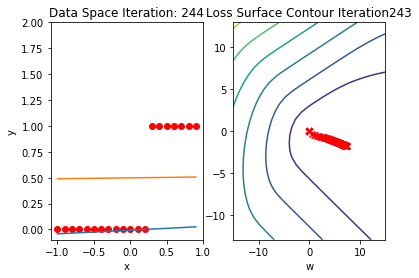

(100, 3)
(3, 1)
(100, 1)
(100, 1)


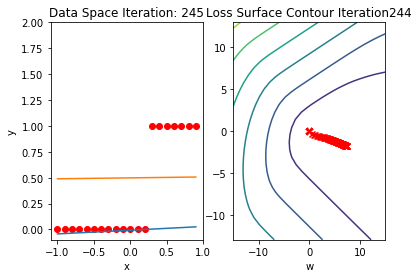

(100, 3)
(3, 1)
(100, 1)
(100, 1)


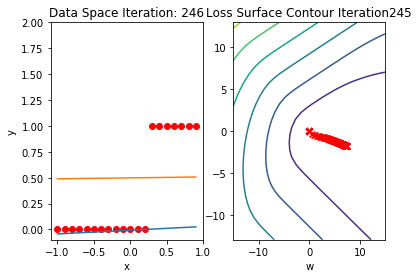

(100, 3)
(3, 1)
(100, 1)
(100, 1)


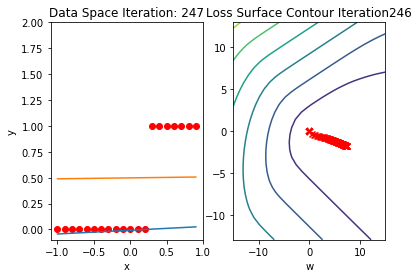

(100, 3)
(3, 1)
(100, 1)
(100, 1)


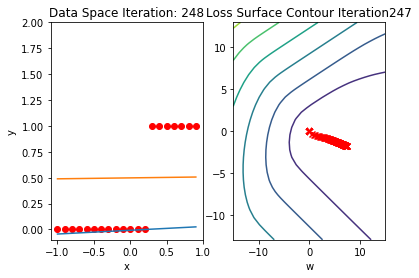

(100, 3)
(3, 1)
(100, 1)
(100, 1)


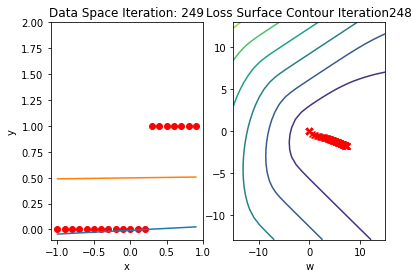

(100, 3)
(3, 1)
(100, 1)
(100, 1)


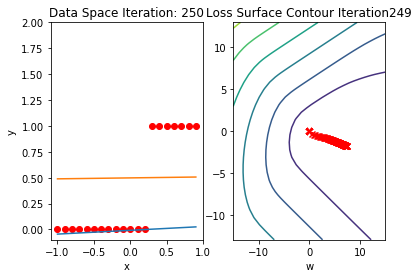

(100, 3)
(3, 1)
(100, 1)
(100, 1)


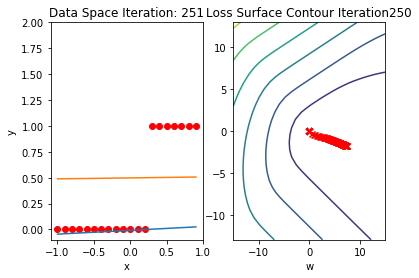

(100, 3)
(3, 1)
(100, 1)
(100, 1)


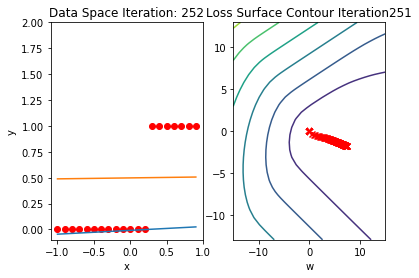

(100, 3)
(3, 1)
(100, 1)
(100, 1)


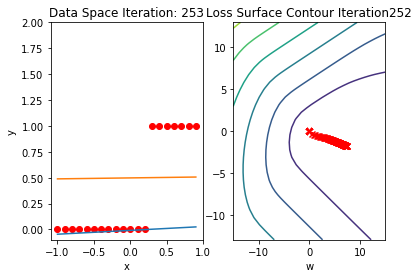

(100, 3)
(3, 1)
(100, 1)
(100, 1)


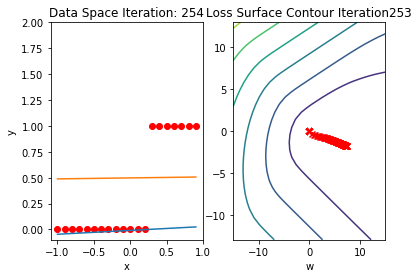

(100, 3)
(3, 1)
(100, 1)
(100, 1)


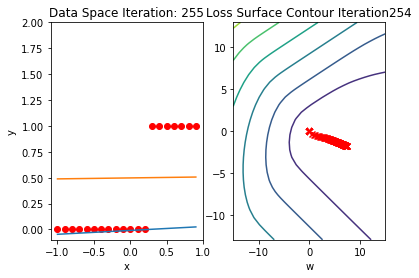

(100, 3)
(3, 1)
(100, 1)
(100, 1)


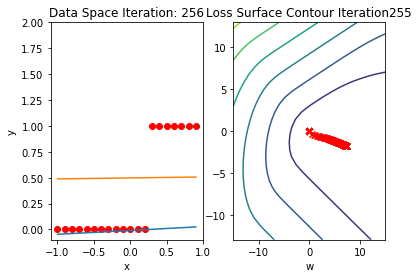

(100, 3)
(3, 1)
(100, 1)
(100, 1)


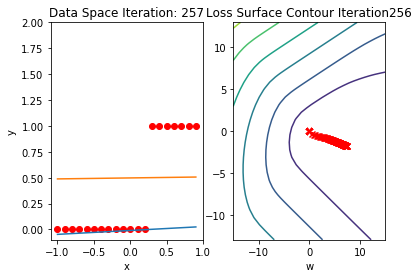

(100, 3)
(3, 1)
(100, 1)
(100, 1)


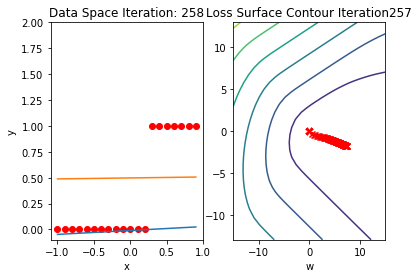

(100, 3)
(3, 1)
(100, 1)
(100, 1)


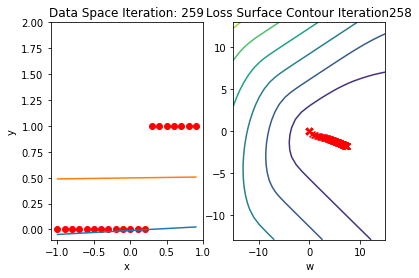

(100, 3)
(3, 1)
(100, 1)
(100, 1)


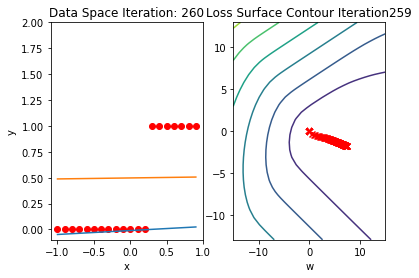

(100, 3)
(3, 1)
(100, 1)
(100, 1)


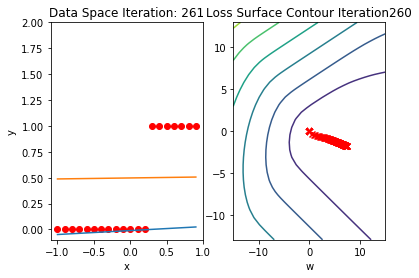

(100, 3)
(3, 1)
(100, 1)
(100, 1)


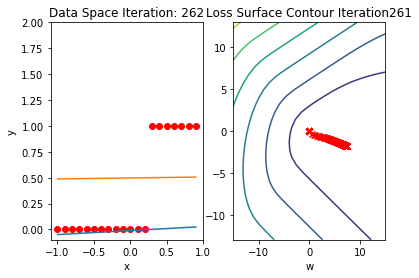

(100, 3)
(3, 1)
(100, 1)
(100, 1)


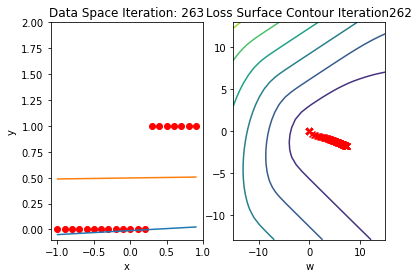

(100, 3)
(3, 1)
(100, 1)
(100, 1)


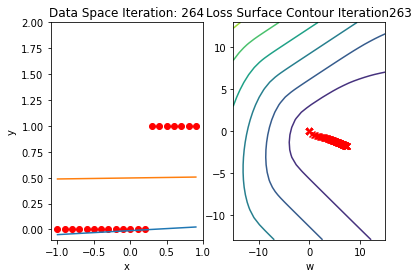

(100, 3)
(3, 1)
(100, 1)
(100, 1)


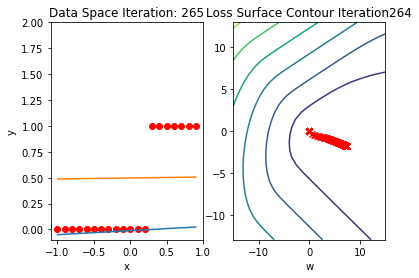

(100, 3)
(3, 1)
(100, 1)
(100, 1)


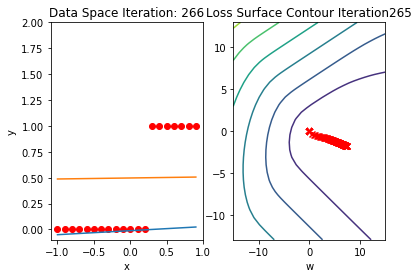

(100, 3)
(3, 1)
(100, 1)
(100, 1)


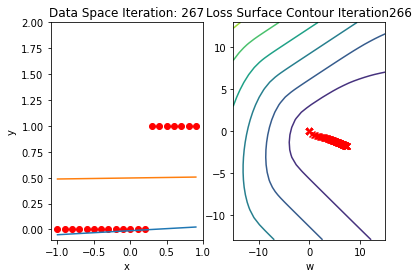

(100, 3)
(3, 1)
(100, 1)
(100, 1)


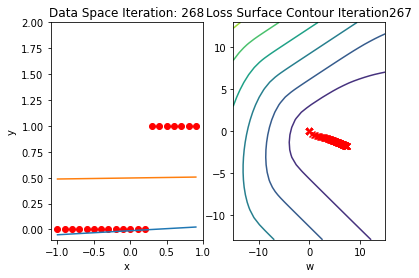

(100, 3)
(3, 1)
(100, 1)
(100, 1)


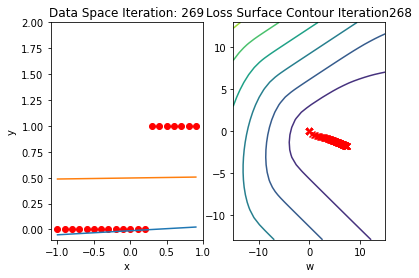

(100, 3)
(3, 1)
(100, 1)
(100, 1)


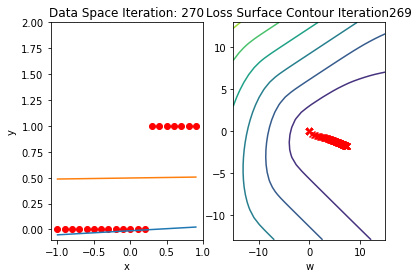

(100, 3)
(3, 1)
(100, 1)
(100, 1)


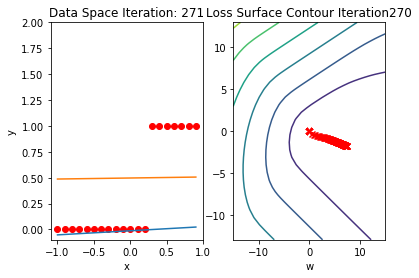

(100, 3)
(3, 1)
(100, 1)
(100, 1)


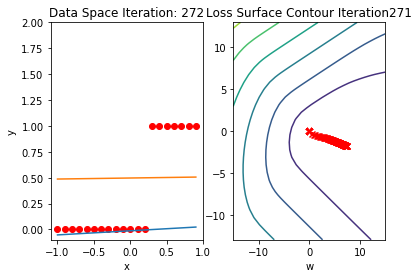

(100, 3)
(3, 1)
(100, 1)
(100, 1)


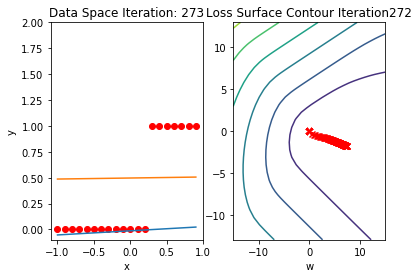

(100, 3)
(3, 1)
(100, 1)
(100, 1)


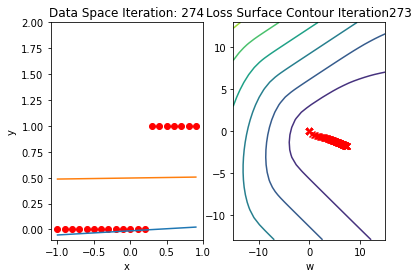

(100, 3)
(3, 1)
(100, 1)
(100, 1)


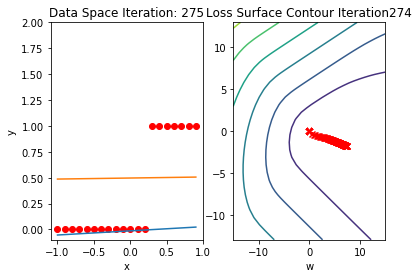

(100, 3)
(3, 1)
(100, 1)
(100, 1)


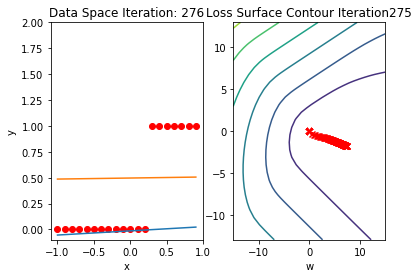

(100, 3)
(3, 1)
(100, 1)
(100, 1)


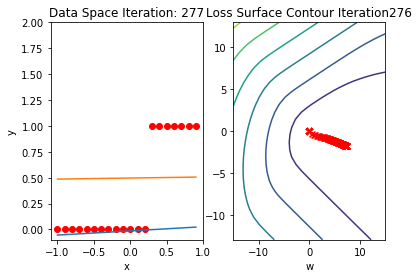

(100, 3)
(3, 1)
(100, 1)
(100, 1)


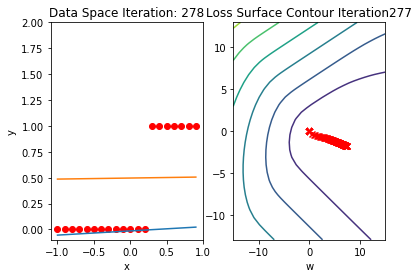

(100, 3)
(3, 1)
(100, 1)
(100, 1)


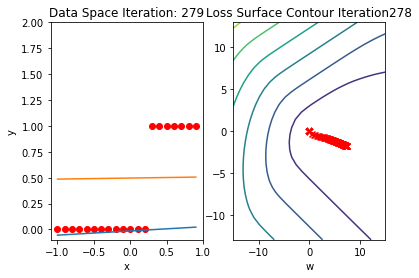

(100, 3)
(3, 1)
(100, 1)
(100, 1)


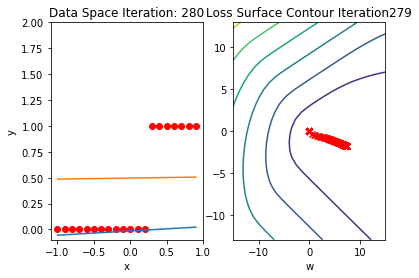

(100, 3)
(3, 1)
(100, 1)
(100, 1)


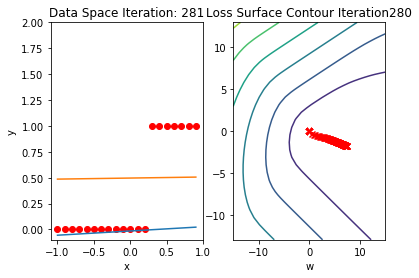

(100, 3)
(3, 1)
(100, 1)
(100, 1)


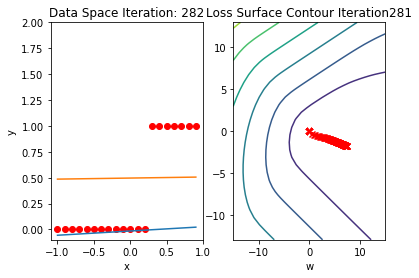

(100, 3)
(3, 1)
(100, 1)
(100, 1)


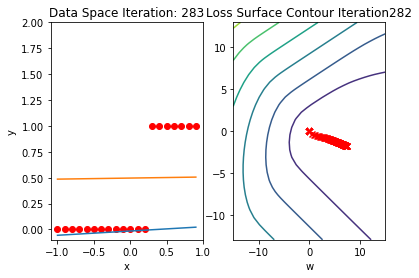

(100, 3)
(3, 1)
(100, 1)
(100, 1)


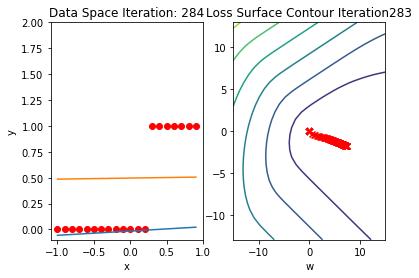

(100, 3)
(3, 1)
(100, 1)
(100, 1)


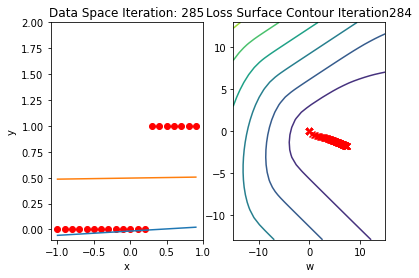

(100, 3)
(3, 1)
(100, 1)
(100, 1)


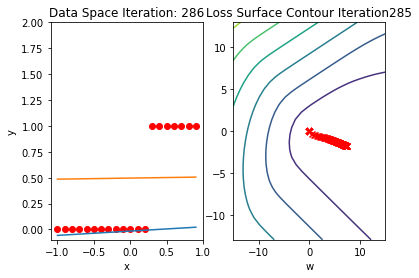

(100, 3)
(3, 1)
(100, 1)
(100, 1)


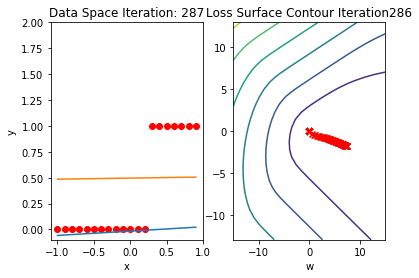

(100, 3)
(3, 1)
(100, 1)
(100, 1)


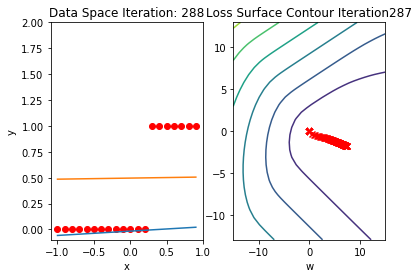

(100, 3)
(3, 1)
(100, 1)
(100, 1)


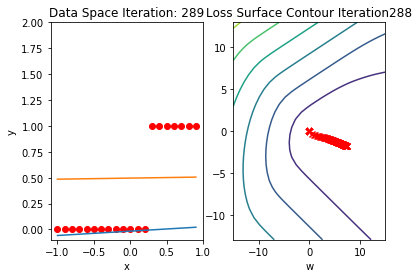

(100, 3)
(3, 1)
(100, 1)
(100, 1)


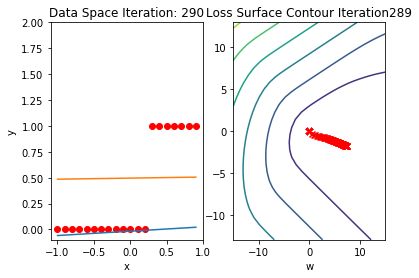

(100, 3)
(3, 1)
(100, 1)
(100, 1)


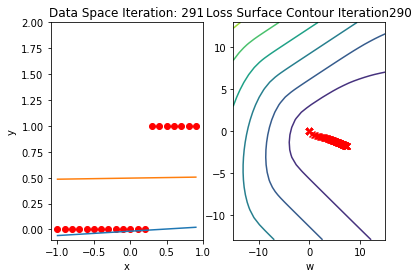

(100, 3)
(3, 1)
(100, 1)
(100, 1)


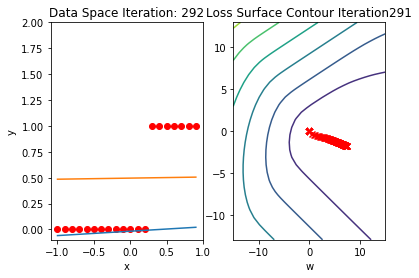

(100, 3)
(3, 1)
(100, 1)
(100, 1)


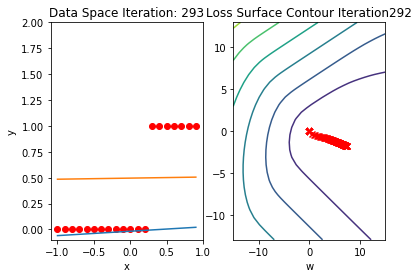

(100, 3)
(3, 1)
(100, 1)
(100, 1)


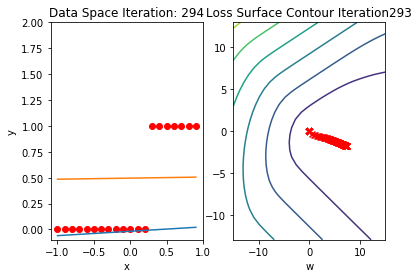

(100, 3)
(3, 1)
(100, 1)
(100, 1)


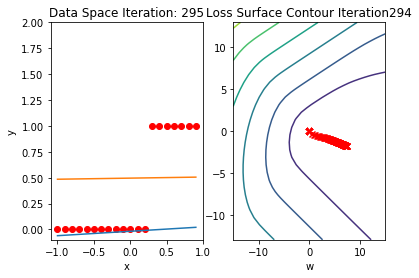

(100, 3)
(3, 1)
(100, 1)
(100, 1)


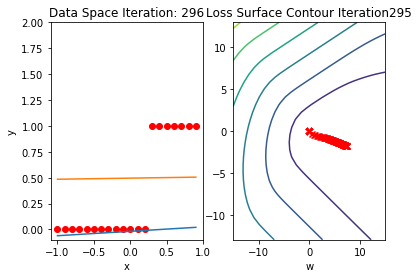

(100, 3)
(3, 1)
(100, 1)
(100, 1)


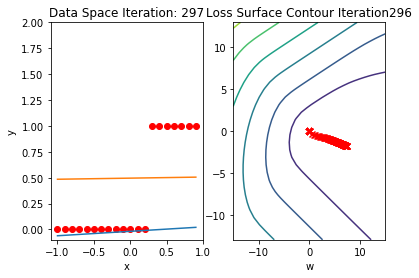

(100, 3)
(3, 1)
(100, 1)
(100, 1)


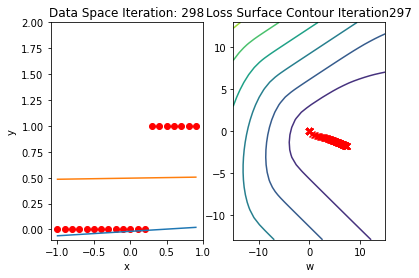

(100, 3)
(3, 1)
(100, 1)
(100, 1)


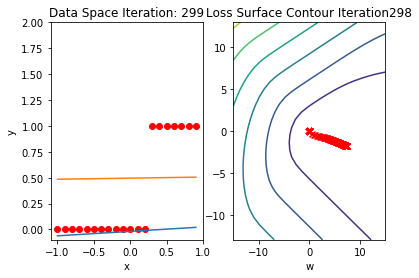

(100, 3)
(3, 1)
(100, 1)
(100, 1)


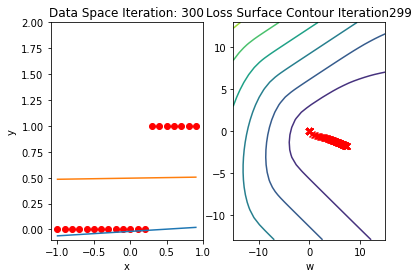

(100, 3)
(3, 1)
(100, 1)
(100, 1)


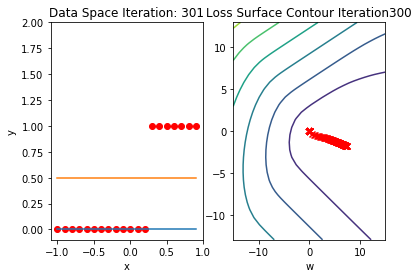

(100, 3)
(3, 1)
(100, 1)
(100, 1)


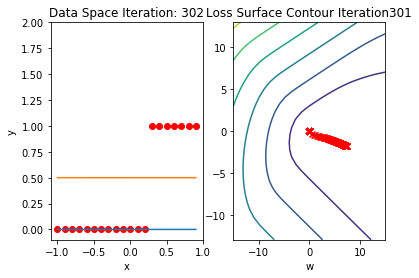

(100, 3)
(3, 1)
(100, 1)
(100, 1)


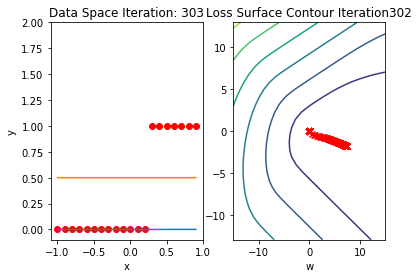

(100, 3)
(3, 1)
(100, 1)
(100, 1)


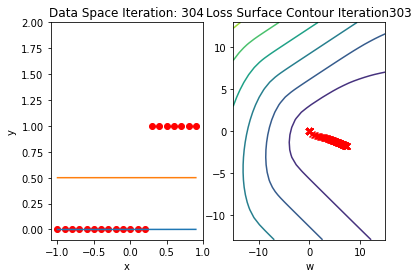

(100, 3)
(3, 1)
(100, 1)
(100, 1)


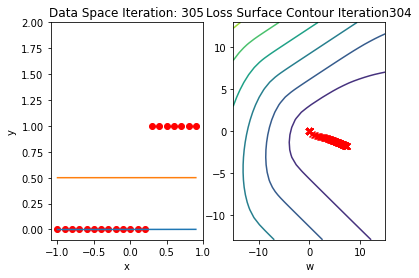

(100, 3)
(3, 1)
(100, 1)
(100, 1)


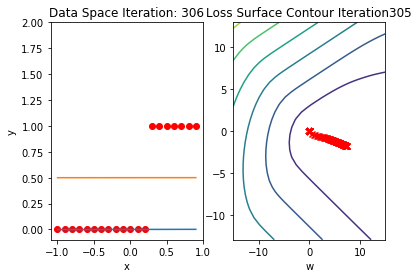

(100, 3)
(3, 1)
(100, 1)
(100, 1)


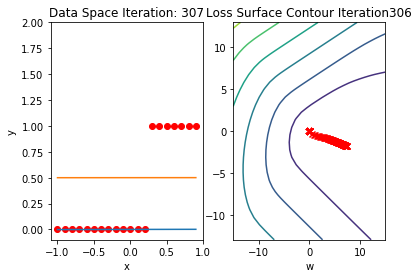

(100, 3)
(3, 1)
(100, 1)
(100, 1)


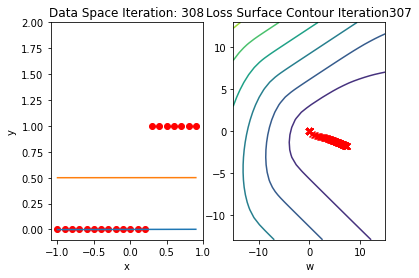

(100, 3)
(3, 1)
(100, 1)
(100, 1)


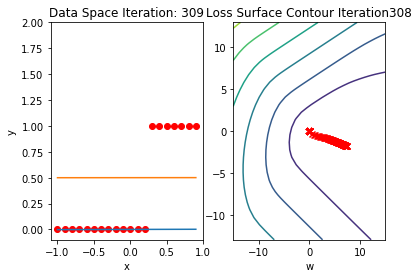

(100, 3)
(3, 1)
(100, 1)
(100, 1)


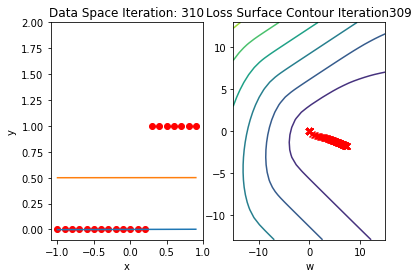

(100, 3)
(3, 1)
(100, 1)
(100, 1)


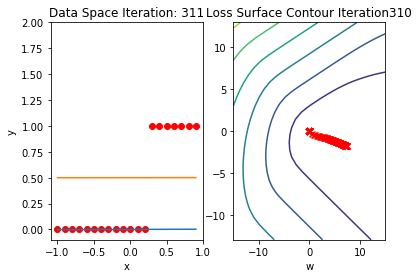

(100, 3)
(3, 1)
(100, 1)
(100, 1)


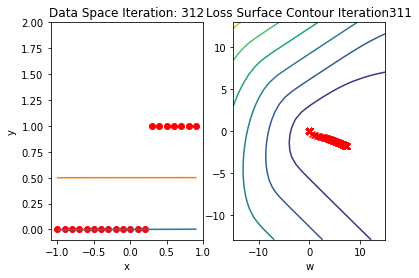

(100, 3)
(3, 1)
(100, 1)
(100, 1)


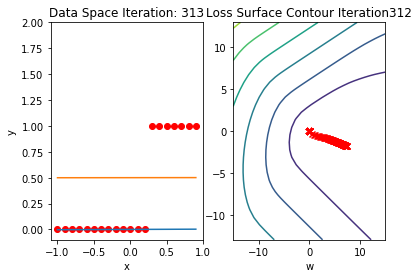

(100, 3)
(3, 1)
(100, 1)
(100, 1)


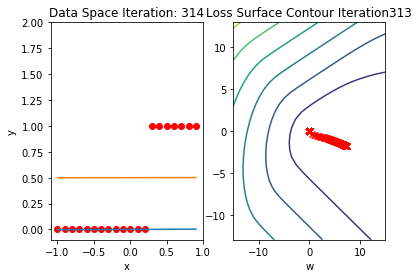

(100, 3)
(3, 1)
(100, 1)
(100, 1)


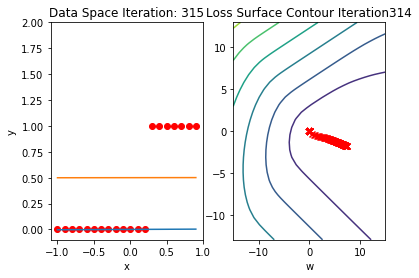

(100, 3)
(3, 1)
(100, 1)
(100, 1)


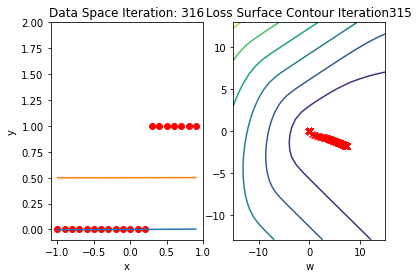

(100, 3)
(3, 1)
(100, 1)
(100, 1)


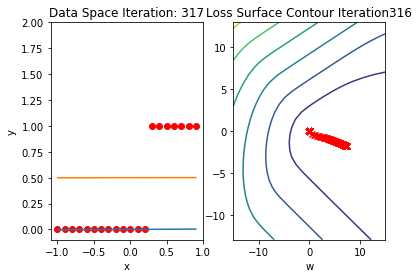

(100, 3)
(3, 1)
(100, 1)
(100, 1)


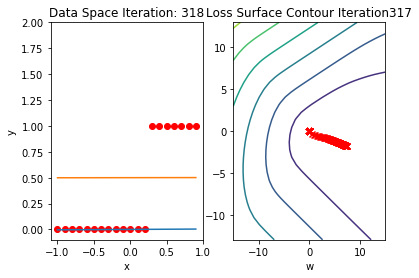

(100, 3)
(3, 1)
(100, 1)
(100, 1)


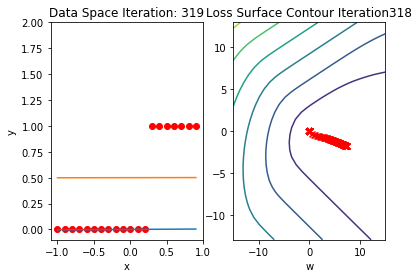

(100, 3)
(3, 1)
(100, 1)
(100, 1)


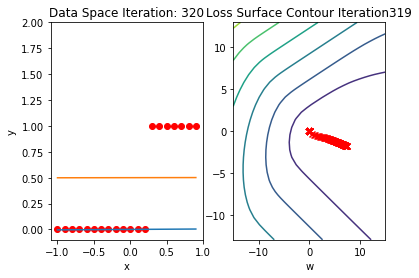

(100, 3)
(3, 1)
(100, 1)
(100, 1)


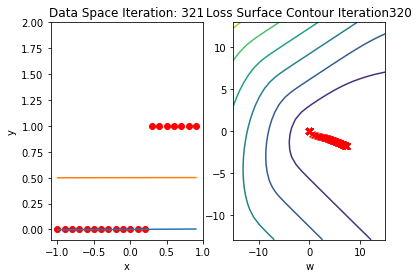

(100, 3)
(3, 1)
(100, 1)
(100, 1)


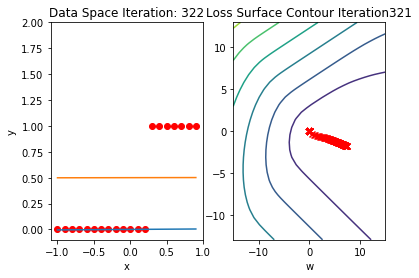

(100, 3)
(3, 1)
(100, 1)
(100, 1)


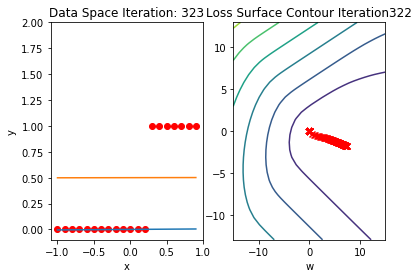

(100, 3)
(3, 1)
(100, 1)
(100, 1)


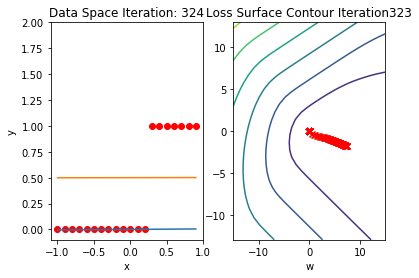

(100, 3)
(3, 1)
(100, 1)
(100, 1)


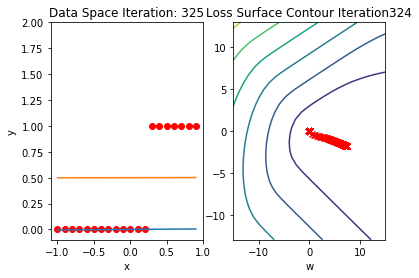

(100, 3)
(3, 1)
(100, 1)
(100, 1)


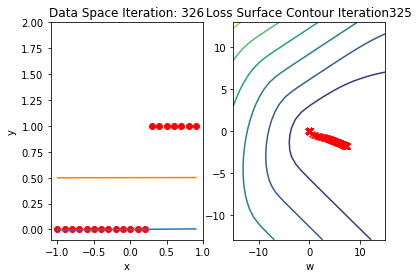

(100, 3)
(3, 1)
(100, 1)
(100, 1)


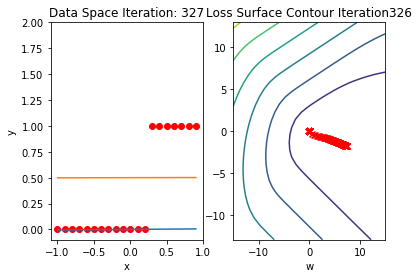

(100, 3)
(3, 1)
(100, 1)
(100, 1)


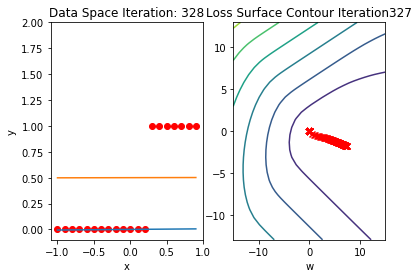

(100, 3)
(3, 1)
(100, 1)
(100, 1)


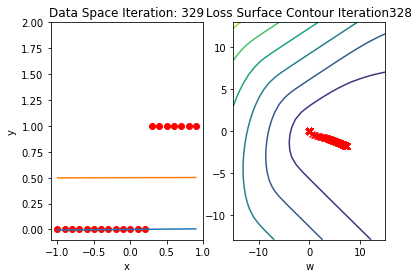

(100, 3)
(3, 1)
(100, 1)
(100, 1)


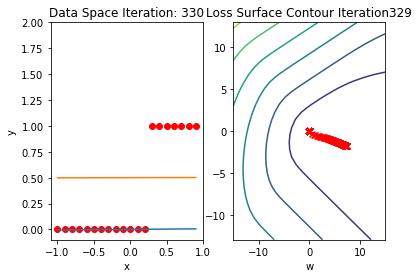

(100, 3)
(3, 1)
(100, 1)
(100, 1)


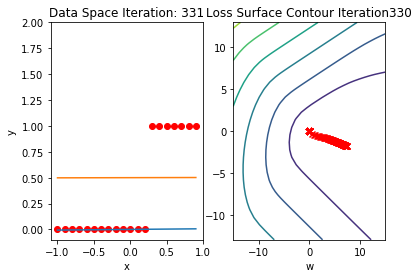

(100, 3)
(3, 1)
(100, 1)
(100, 1)


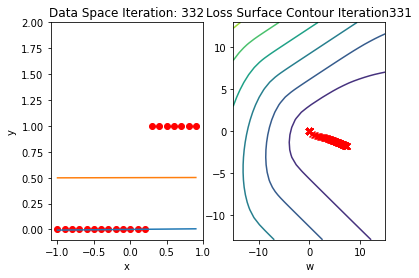

(100, 3)
(3, 1)
(100, 1)
(100, 1)


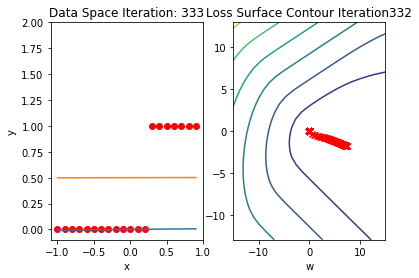

(100, 3)
(3, 1)
(100, 1)
(100, 1)


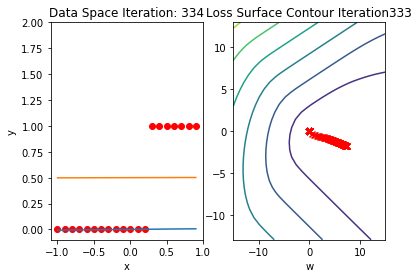

(100, 3)
(3, 1)
(100, 1)
(100, 1)


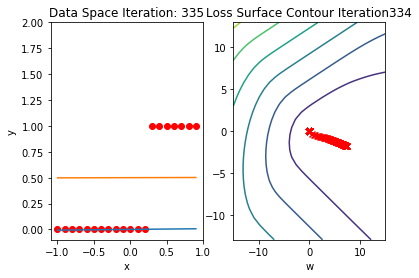

(100, 3)
(3, 1)
(100, 1)
(100, 1)


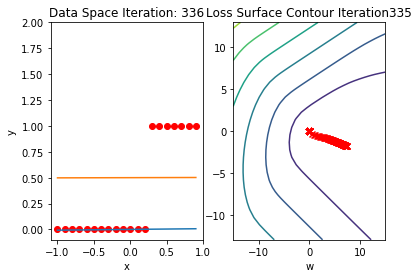

(100, 3)
(3, 1)
(100, 1)
(100, 1)


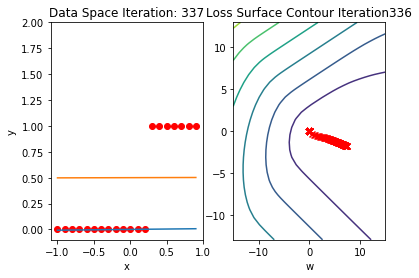

(100, 3)
(3, 1)
(100, 1)
(100, 1)


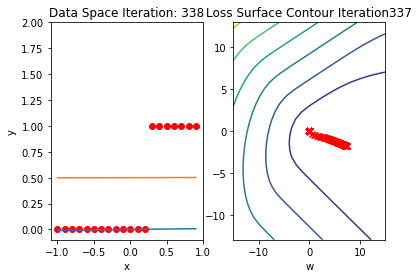

(100, 3)
(3, 1)
(100, 1)
(100, 1)


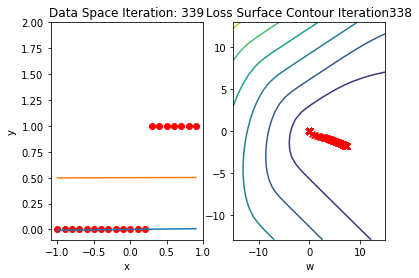

(100, 3)
(3, 1)
(100, 1)
(100, 1)


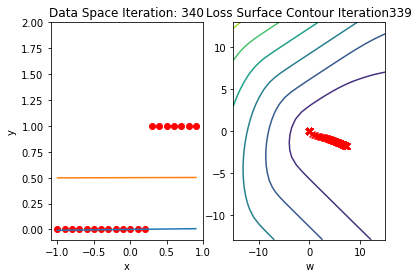

(100, 3)
(3, 1)
(100, 1)
(100, 1)


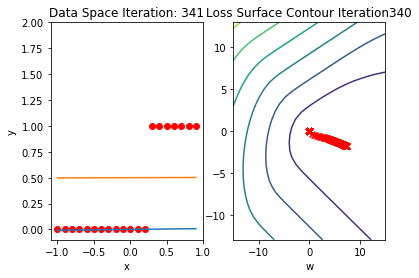

(100, 3)
(3, 1)
(100, 1)
(100, 1)


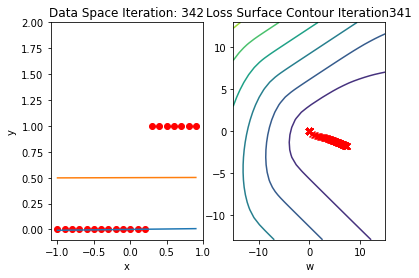

(100, 3)
(3, 1)
(100, 1)
(100, 1)


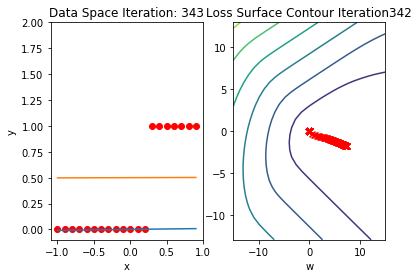

(100, 3)
(3, 1)
(100, 1)
(100, 1)


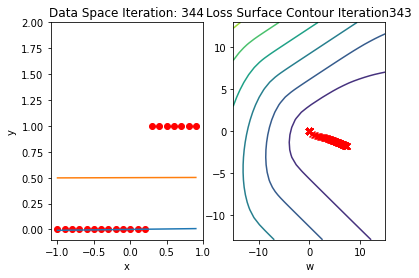

(100, 3)
(3, 1)
(100, 1)
(100, 1)


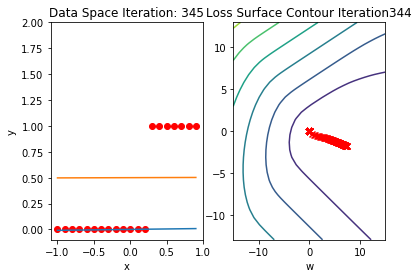

(100, 3)
(3, 1)
(100, 1)
(100, 1)


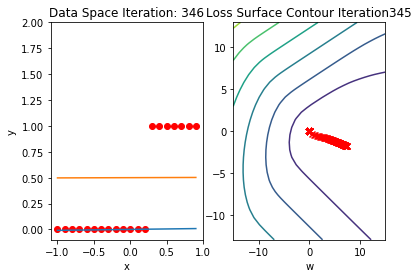

(100, 3)
(3, 1)
(100, 1)
(100, 1)


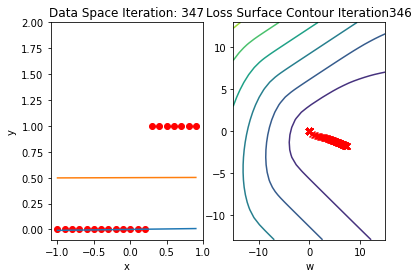

(100, 3)
(3, 1)
(100, 1)
(100, 1)


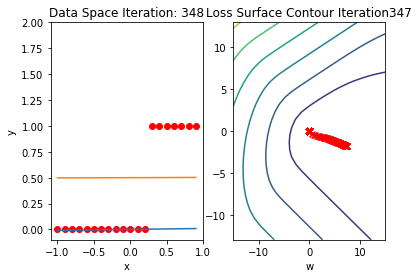

(100, 3)
(3, 1)
(100, 1)
(100, 1)


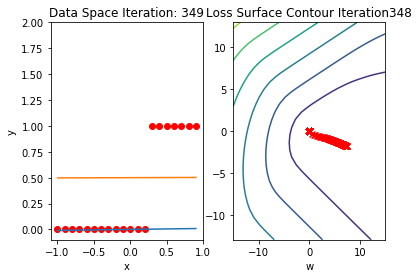

(100, 3)
(3, 1)
(100, 1)
(100, 1)


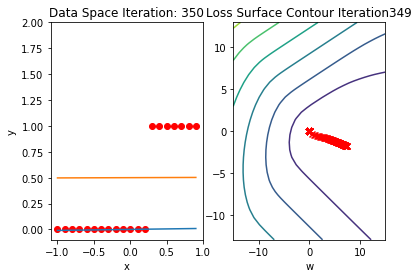

(100, 3)
(3, 1)
(100, 1)
(100, 1)


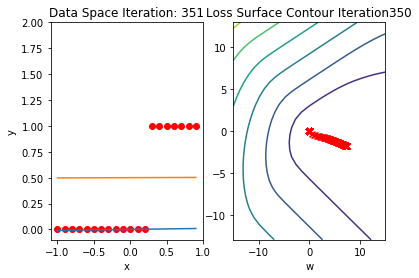

(100, 3)
(3, 1)
(100, 1)
(100, 1)


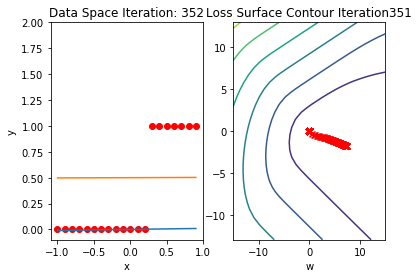

(100, 3)
(3, 1)
(100, 1)
(100, 1)


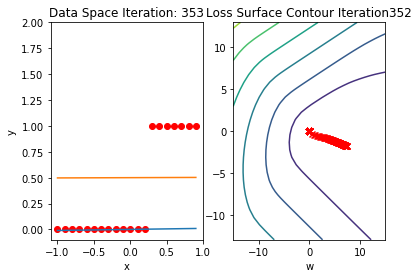

(100, 3)
(3, 1)
(100, 1)
(100, 1)


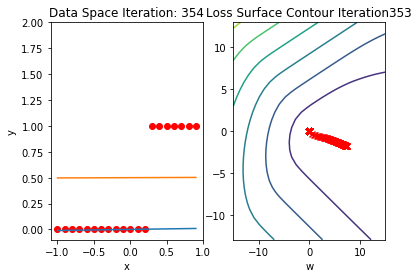

(100, 3)
(3, 1)
(100, 1)
(100, 1)


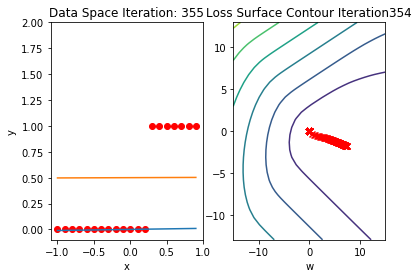

(100, 3)
(3, 1)
(100, 1)
(100, 1)


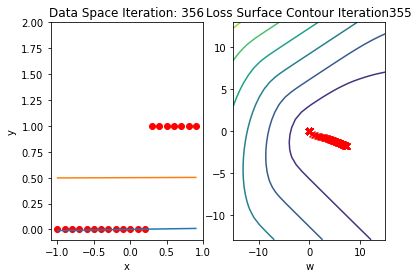

(100, 3)
(3, 1)
(100, 1)
(100, 1)


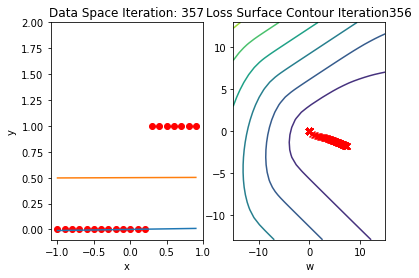

(100, 3)
(3, 1)
(100, 1)
(100, 1)


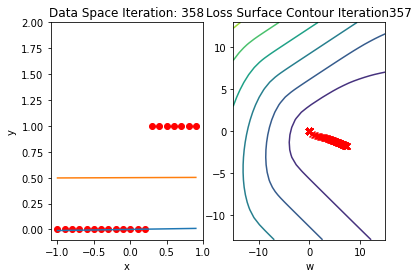

(100, 3)
(3, 1)
(100, 1)
(100, 1)


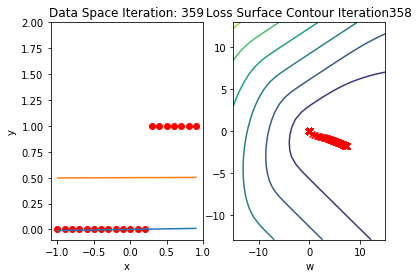

(100, 3)
(3, 1)
(100, 1)
(100, 1)


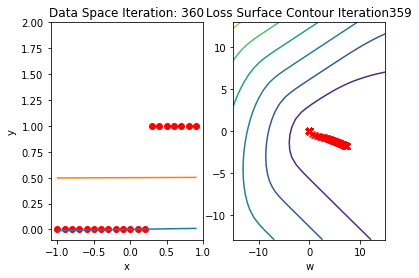

(100, 3)
(3, 1)
(100, 1)
(100, 1)


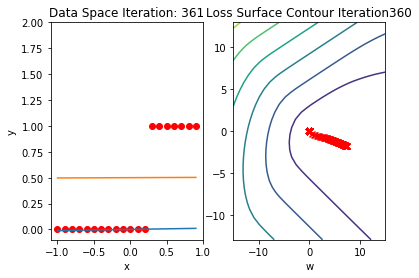

(100, 3)
(3, 1)
(100, 1)
(100, 1)


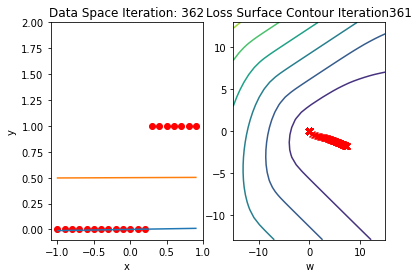

(100, 3)
(3, 1)
(100, 1)
(100, 1)


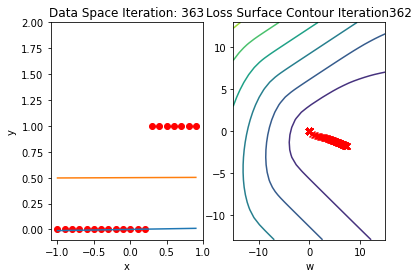

(100, 3)
(3, 1)
(100, 1)
(100, 1)


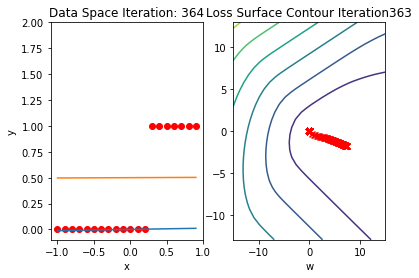

(100, 3)
(3, 1)
(100, 1)
(100, 1)


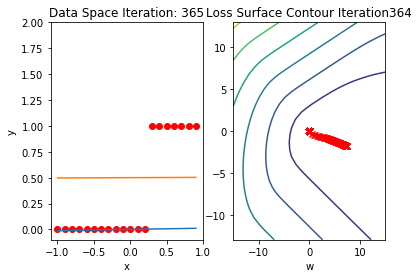

(100, 3)
(3, 1)
(100, 1)
(100, 1)


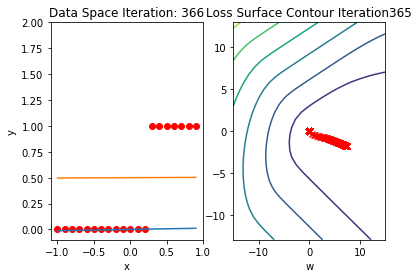

(100, 3)
(3, 1)
(100, 1)
(100, 1)


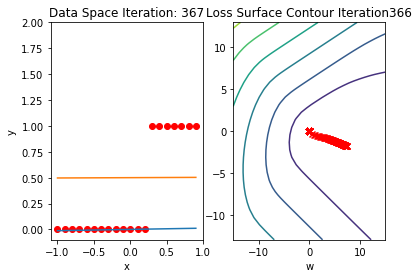

(100, 3)
(3, 1)
(100, 1)
(100, 1)


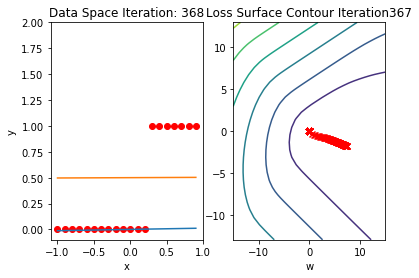

(100, 3)
(3, 1)
(100, 1)
(100, 1)


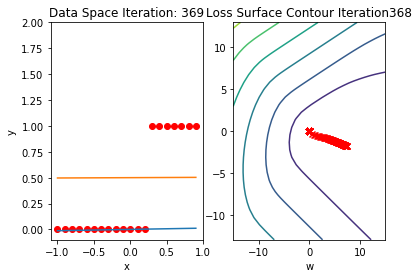

(100, 3)
(3, 1)
(100, 1)
(100, 1)


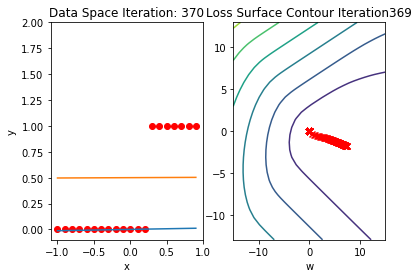

(100, 3)
(3, 1)
(100, 1)
(100, 1)


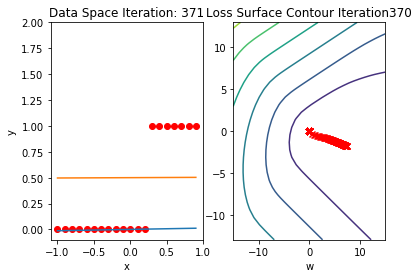

(100, 3)
(3, 1)
(100, 1)
(100, 1)


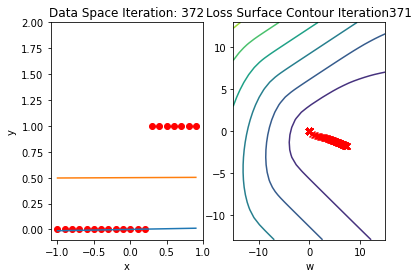

(100, 3)
(3, 1)
(100, 1)
(100, 1)


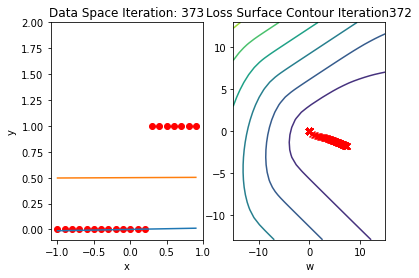

(100, 3)
(3, 1)
(100, 1)
(100, 1)


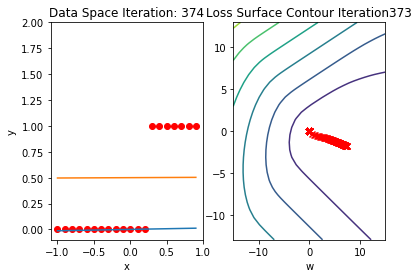

(100, 3)
(3, 1)
(100, 1)
(100, 1)


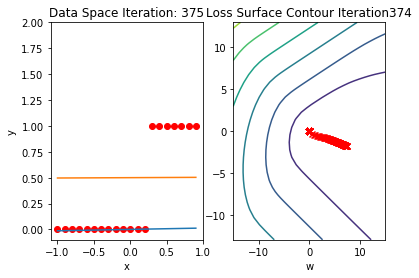

(100, 3)
(3, 1)
(100, 1)
(100, 1)


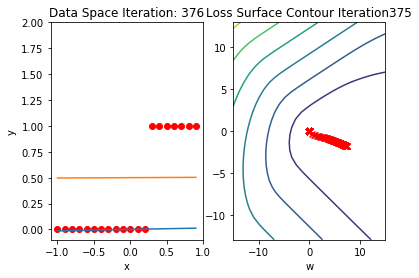

(100, 3)
(3, 1)
(100, 1)
(100, 1)


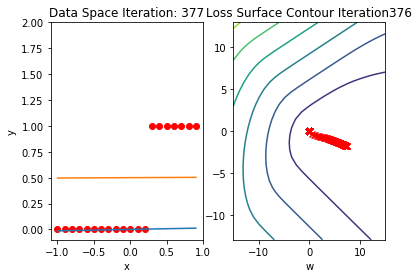

(100, 3)
(3, 1)
(100, 1)
(100, 1)


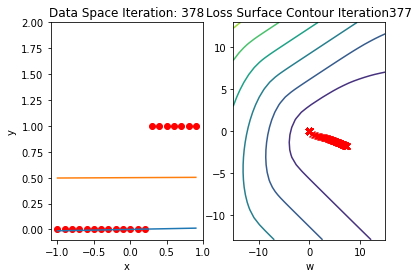

(100, 3)
(3, 1)
(100, 1)
(100, 1)


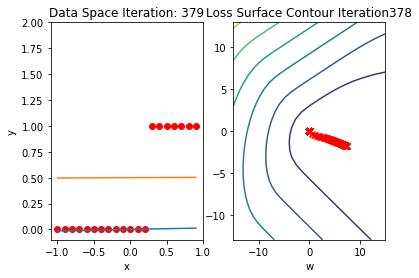

(100, 3)
(3, 1)
(100, 1)
(100, 1)


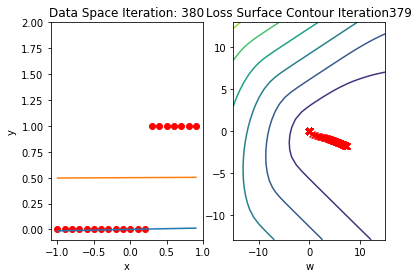

(100, 3)
(3, 1)
(100, 1)
(100, 1)


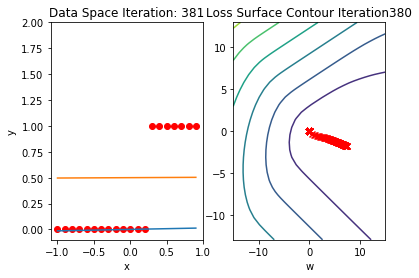

(100, 3)
(3, 1)
(100, 1)
(100, 1)


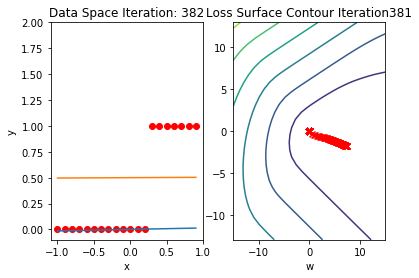

(100, 3)
(3, 1)
(100, 1)
(100, 1)


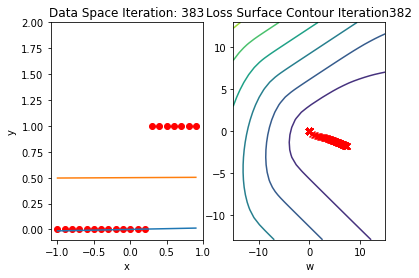

(100, 3)
(3, 1)
(100, 1)
(100, 1)


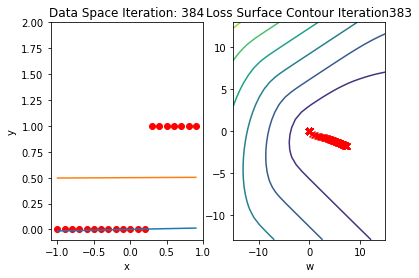

(100, 3)
(3, 1)
(100, 1)
(100, 1)


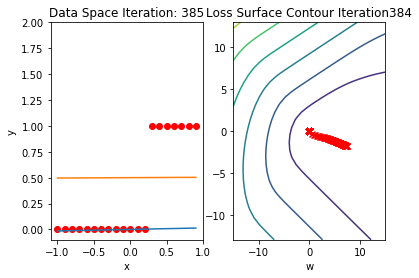

(100, 3)
(3, 1)
(100, 1)
(100, 1)


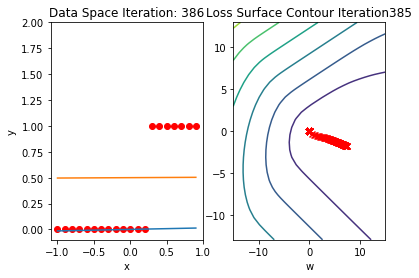

(100, 3)
(3, 1)
(100, 1)
(100, 1)


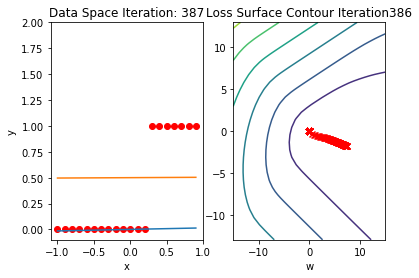

(100, 3)
(3, 1)
(100, 1)
(100, 1)


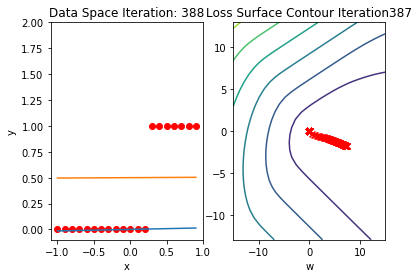

(100, 3)
(3, 1)
(100, 1)
(100, 1)


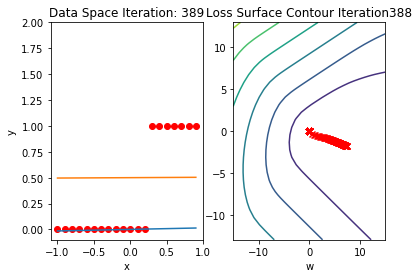

(100, 3)
(3, 1)
(100, 1)
(100, 1)


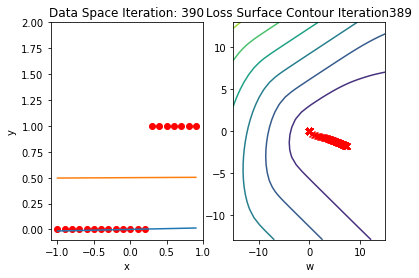

(100, 3)
(3, 1)
(100, 1)
(100, 1)


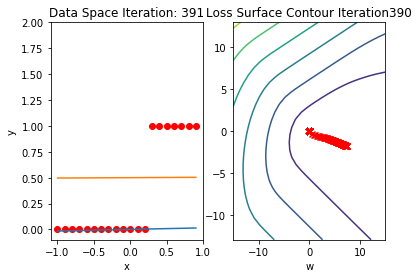

(100, 3)
(3, 1)
(100, 1)
(100, 1)


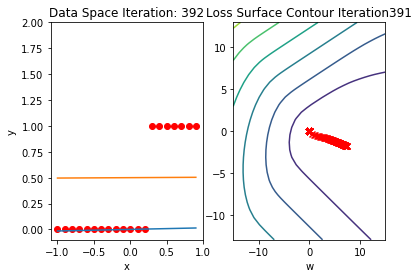

(100, 3)
(3, 1)
(100, 1)
(100, 1)


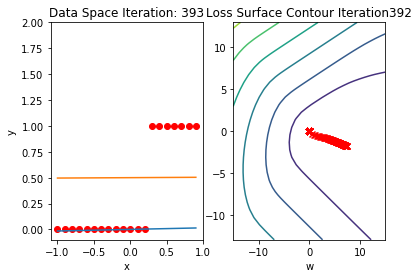

(100, 3)
(3, 1)
(100, 1)
(100, 1)


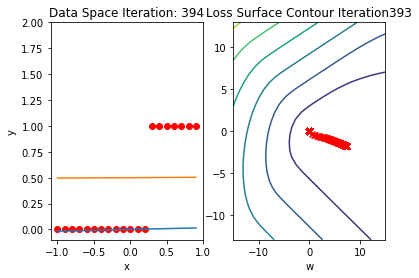

(100, 3)
(3, 1)
(100, 1)
(100, 1)


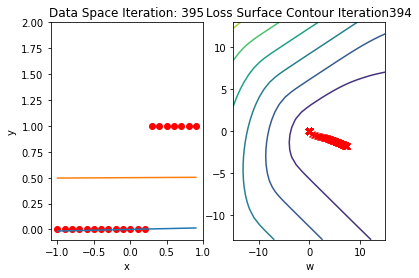

(100, 3)
(3, 1)
(100, 1)
(100, 1)


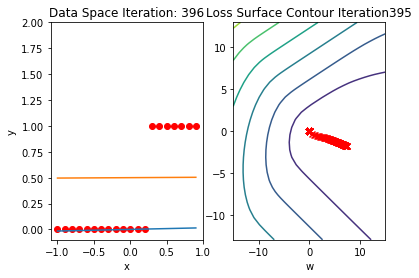

(100, 3)
(3, 1)
(100, 1)
(100, 1)


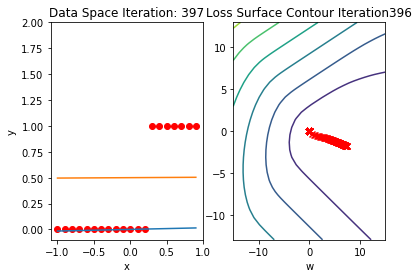

(100, 3)
(3, 1)
(100, 1)
(100, 1)


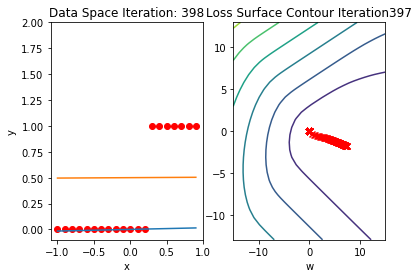

(100, 3)
(3, 1)
(100, 1)
(100, 1)


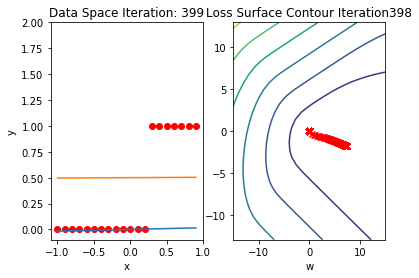

(100, 3)
(3, 1)
(100, 1)
(100, 1)


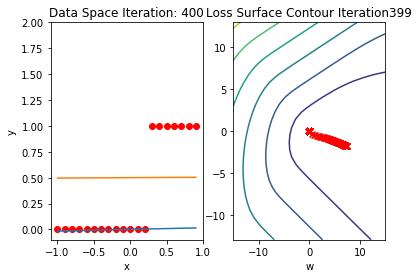

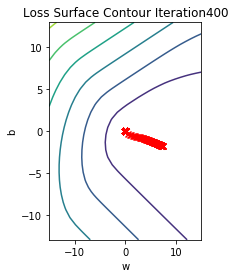

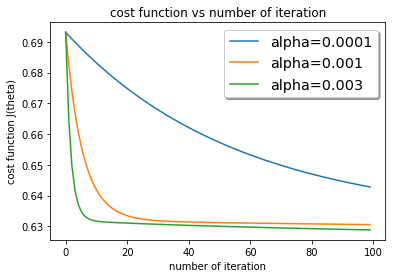

In [32]:
# calculate the optimal value of theta that minimize cost function
theta_opt1,J1=train_model(theta_init,100,lr=0.001)
theta_opt2,J2=train_model(theta_init,100,lr=0.003)
theta_opt3,J3=train_model(theta_init,100,lr=0.0001)

plt.figure('Learning curves')
plt.plot(range(len(J3)),J3,label='alpha=0.0001')
plt.plot(range(len(J1)),J1,label='alpha=0.001')
plt.plot(range(len(J2)),J2,label='alpha=0.003')

plt.xlabel('number of iteration')
plt.ylabel('cost function J(theta)')
plt.title('cost function vs number of iteration')
plt.legend(loc='best', shadow=True, fontsize='x-large')

# Type your code here
best_alpha = 0.003    # set the best value of alpha

As can we see, with value alpha is 0.003, the cost reduce with the fastest speed after certains iteration.
Therefore, we will use 0.003 as the optimaze value for the next.

**Question 8:** 
- Print the optimal value of theta that minimize cost function.
- Print the final loss.

In [33]:
# Type your code here
print("The optimal value of theta that minimize cost function is: ",best_alpha)
print('The final loss is: ',J2[-1])

The optimal value of theta that minimize cost function is:  0.003
The final loss is:  0.6287993921323715


**Question 9: **
- Use the optimal theta calculated to predict the result of student who has a score of 11 in exam 1 and a score of 9.5 in exam 2.  

** Note:** The execution of this block of code could take up to one minute.

In [47]:
# Type your code here
theta_opt= theta_opt3
# predict student result

exam_1 = 11
exam_2 = 9.5

result = sigmoid(np.dot(np.array([1, exam_1, exam_2]), theta_opt))

print("The predicted result of student with {0} and {1} scores is: {2}".format(exam_1,exam_2,['Not admitted','Admitted'][int(result)]))
print("With an admission probability: ",result)

The predicted result of student with 11 and 9.5 scores is: Not admitted
With an admission probability:  [0.57871488]


Let's plot the loss and the classifier decision boundries and data

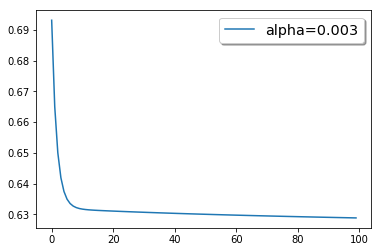

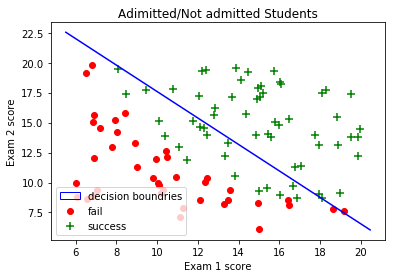

In [48]:
# plot learning curve
plt.figure('Learning curve')
plt.plot(range(len(J2)),J2,label='alpha=0.003')
plt.legend(loc='best', shadow=True, fontsize='x-large')

# plot classifier decision boundries and data 
plt.figure('decision boundries')
fail=plt.scatter(x_1[Y==0], x_2[Y==0],  color='red',label='fail')
succ=plt.scatter(x_1[Y==1], x_2[Y==1],  color='green',marker='+',s=80, label='success')

plt.plot([np.min(X[:,1])-0.5,np.max(X[:,1])+0.5],[(-theta_opt[0,0]+theta_opt[1,0]*(np.max(X[:,1])+0.5))/theta_opt[2,0],(-theta_opt[0,0]+theta_opt[1,0]*(np.min(X[:,1])-0.5))/theta_opt[2,0]],color="blue")

#plot_x = np.array([np.min(x[:, 1]) - 2, np.max(x[:, 1] + 2)])
#plot_y = -(theta[0] + theta[1] * plot_x) / theta[2]

plt.xlabel('Exam 1 score')
plt.ylabel('Exam 2 score')
plt.title('Adimitted/Not admitted Students')
extra = Rectangle((0, 0), 3, 4, fc="w", fill=False, edgecolor="b", linewidth=1)
plt.legend([extra,fail,succ], ("decision boundries","fail","success"),loc='lower left')

#### Minimize cost function with python optimization function:
We note that the gradient descent algorithm takes a lot of time and it is not suitable for optimizing complex  function like logistic cost function. Hence, we will use [fmin_bfgs](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.optimize.fmin_bfgs.html) optimization function from the [scipy](https://www.scipy.org/) library in python.  

**Question 10: **
- The "fmin_bfgs" function work with theta and gradient array in form (n,) and nor (n,1). re-implement cost function ("cost_func2") and gradient function ("grad_cost_func2") that deal with this kind of arrays.
- Call "fmin_bfgs" function to calculate the optimal theta. This function take as parameters: the name of cost function ("cost_func2"), the name of gradient cost function ("grad_cost_func2") and the initial theta ("theta0").  
**Hint:** You could use [reshape](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.ndarray.reshape.html) function to modify the shape of the gradient vector

Optimization terminated successfully.
         Current function value: 0.203398
         Iterations: 18
         Function evaluations: 24
         Gradient evaluations: 24
The optimal value of theta that minimize cost function is:  [-25.1725301   1.0316124   1.0077848]
Final error =  0.20339833822270464


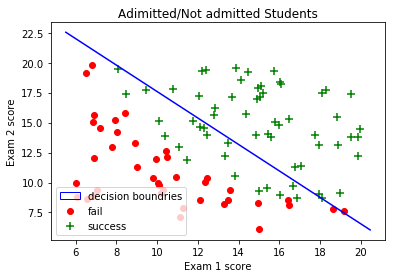

In [49]:
def cost_func2(theta):
    # Type your code here
    J=NLL_cost(predict(X,theta[:,np.newaxis]),Y)
    return J 

def grad_cost_func2(theta):
    g=grad_cost_func(theta[:,np.newaxis],X,Y)
    g.shape=(g.shape[0],)
    return g  

# calculate the optimal theta
theta0=np.array([0,0,0],dtype=float)

# Type your code here
Thopt,_,_,_,_,_,_,  = fmin_bfgs(cost_func2, theta0, grad_cost_func2, full_output=True)

print("The optimal value of theta that minimize cost function is: ",Thopt)
print("Final error = ",cost_func2(Thopt))

# plot linear model and data 
plt.figure('Linear decision boundries')
fail=plt.scatter(x_1[Y==0], x_2[Y==0],  color='red',label='fail')
succ=plt.scatter(x_1[Y==1], x_2[Y==1],  color='green',marker='+',s=80, label='success')
plt.plot([np.min(X[:,1])-0.5,np.max(X[:,1])+0.5],[(-theta_opt[0,0]+theta_opt[1,0]*(np.max(X[:,1])+0.5))/theta_opt[2,0],(-theta_opt[0,0]+theta_opt[1,0]*(np.min(X[:,1])-0.5))/theta_opt[2,0]],color="blue")
plt.xlabel('Exam 1 score')
plt.ylabel('Exam 2 score')
plt.title('Adimitted/Not admitted Students')
plt.legend([extra,fail,succ], ("decision boundries","fail","success"),loc='lower left')

In [1]:
'''We were able to draw the line to separate the admited and Not adimited students.
The final error is around 20%
'''

'We were able to draw the line to separate the admited and Not adimited students.\nThe final error is around 20%\n'